In [1]:
# Import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pylab as pl
import seaborn as sns
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn import manifold, decomposition

from sklearn import cluster, metrics
from sklearn.decomposition import NMF, LatentDirichletAllocation


import tensorflow as tf
import tensorflow.keras
from tensorflow import keras
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import preprocess_input
from keras.applications.mobilenet_v2 import MobileNetV2
from keras.applications.mobilenet_v2 import preprocess_input
from keras.applications.inception_v3 import InceptionV3
from keras.applications.inception_v3 import preprocess_input
from keras.applications.densenet import DenseNet201
from keras.applications.densenet import preprocess_input


import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.tokenize import sent_tokenize, word_tokenize
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

from tensorflow.keras import backend as K

from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras import metrics as kmetrics
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
import gensim


import tensorflow_hub as hub

import os
import transformers
from transformers import *


from PIL import Image, ImageOps, ImageFilter
import cv2
import time

import warnings
%matplotlib inline
warnings.filterwarnings('ignore')

C:\Users\bouza\anaconda3\lib\site-packages\transformers\generation_utils.py:24: FutureWarning: Importing `GenerationMixin` from `src/transformers/generation_utils.py` is deprecated and will be removed in Transformers v5. Import as `from transformers import GenerationMixin` instead.
  warnings.warn(
C:\Users\bouza\anaconda3\lib\site-packages\transformers\generation_tf_utils.py:24: FutureWarning: Importing `TFGenerationMixin` from `src/transformers/generation_tf_utils.py` is deprecated and will be removed in Transformers v5. Import as `from transformers import TFGenerationMixin` instead.
  warnings.warn(


In [2]:
debut_notebook = time.time()

# Jeu de données

In [3]:
data = pd.read_csv('flipkart_com-ecommerce_sample_1050.csv')
print(data.shape)
data.sample(5)
data_p6 = data.copy()

(1050, 15)


In [4]:
print(data['product_category_tree'][0])

["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]


In [5]:
data['product_name'][0]

'Elegance Polyester Multicolor Abstract Eyelet Door Curtain'

In [6]:
#Extraction des catégories
def extraction_categries(categ, level):
    
  categ = categ.split('["')[1].split('"]')[0]
  cat = categ.split(' >> ')

  if(len(cat)) < 3:
    cat = [cat[0], cat[1], 'Nan']
      
    if(len(cat))<2:
      cat = [cat[0], 'Nan', 'Nan']

  return cat[level]

def categ_1(categ):
  return extraction_categries(categ,0)

def categ_2(categ):
  return extraction_categries(categ,1)

def categ_3(categ):
  return extraction_categries(categ,2)

def tree_categ(dataframe):

  dataframe['categ_level_1'] = dataframe['product_category_tree'].apply(categ_1)
  dataframe['categ_level_2'] = dataframe['product_category_tree'].apply(categ_2)
  dataframe['categ_level_3'] = dataframe['product_category_tree'].apply(categ_3)

  return dataframe.drop(['product_category_tree'], axis=1)

In [7]:
data = tree_categ(data)

In [8]:
# nbre de categories par niveau
print('nbre de catégories niveau 1 : ',data['categ_level_1'].nunique())

print('nbre de catégories niveau 2 : ',data['categ_level_2'].nunique())


print('nbre de catégories niveau 3 : ',data['categ_level_3'].nunique())

nbre de catégories niveau 1 :  7
nbre de catégories niveau 2 :  62
nbre de catégories niveau 3 :  242


In [9]:
data.head()

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,categ_level_1,categ_level_2,categ_level_3
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa...",Baby Care,Baby Bath & Skin,Baby Bath Towels
2,64d5d4a258243731dc7bbb1eef49ad74,2016-04-30 03:22:56 +0000,http://www.flipkart.com/eurospa-cotton-terry-f...,Eurospa Cotton Terry Face Towel Set,BTWEG6SHXTDB2A2Y,NaN,NaN,64d5d4a258243731dc7bbb1eef49ad74.jpg,False,Key Features of Eurospa Cotton Terry Face Towe...,No rating available,No rating available,Eurospa,"{""product_specification""=>[{""key""=>""Material"",...",Baby Care,Baby Bath & Skin,Baby Bath Towels
3,d4684dcdc759dd9cdf41504698d737d8,2016-06-20 08:49:52 +0000,http://www.flipkart.com/santosh-royal-fashion-...,SANTOSH ROYAL FASHION Cotton Printed King size...,BDSEJT9UQWHDUBH4,2699.0,1299.0,d4684dcdc759dd9cdf41504698d737d8.jpg,False,Key Features of SANTOSH ROYAL FASHION Cotton P...,No rating available,No rating available,SANTOSH ROYAL FASHION,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Bed Linen,Bedsheets
4,6325b6870c54cd47be6ebfbffa620ec7,2016-06-20 08:49:52 +0000,http://www.flipkart.com/jaipur-print-cotton-fl...,Jaipur Print Cotton Floral King sized Double B...,BDSEJTHNGWVGWWQU,2599.0,698.0,6325b6870c54cd47be6ebfbffa620ec7.jpg,False,Key Features of Jaipur Print Cotton Floral Kin...,No rating available,No rating available,Jaipur Print,"{""product_specification""=>[{""key""=>""Machine Wa...",Home Furnishing,Bed Linen,Bedsheets


In [10]:
data['label']= LabelEncoder().fit_transform(np.array(data['categ_level_1']))

In [11]:
data.head(1)

,uniq_id,crawl_timestamp,product_url,product_name,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications,categ_level_1,categ_level_2,categ_level_3,label
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v...",Home Furnishing,Curtains & Accessories,Curtains,4


In [12]:
data_netoyee=pd.DataFrame()
data_netoyee['image']=data['image']
data_netoyee['description']=data['description']
data_netoyee['categorie']=data['categ_level_1']
data_netoyee['label']=data['label']

data_netoyee.head()

,image,description,categorie,label
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,4
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,0
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,0
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,4
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,4


# Traitement d'images

In [13]:
from os import listdir
path = 'Images/'
list_photos = [file for file in listdir(path)]
print(len(list_photos))

1050


In [14]:
data_netoyee.groupby("label").count()

,image,description,categorie
label,,,
0,150,150,150
1,150,150,150
2,150,150,150
3,150,150,150
4,150,150,150
5,150,150,150
6,150,150,150


## Affichage d'exemples d'images

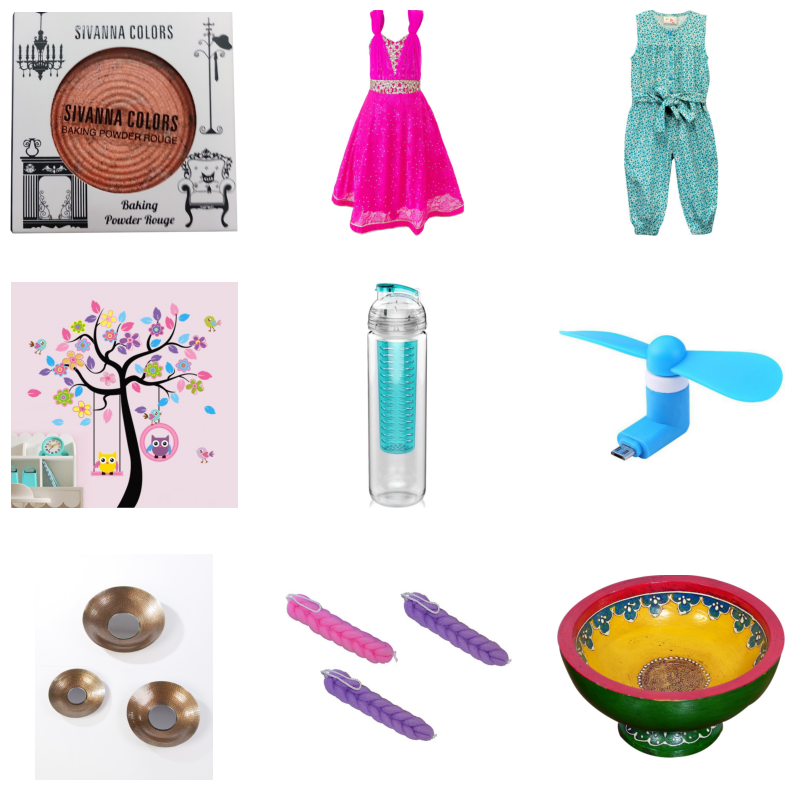

In [15]:
# Sélection de 9 images au hasard
df = data_netoyee.sample(9).reset_index()
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    name = path + df['image'][i]
    img = np.array(Image.open(name))
    plt.imshow(img)
    #plt.title(df['categorie'][i], fontsize=20)
    plt.axis('off')

## Exemple de pré-traitement sur une image

### Histogramme

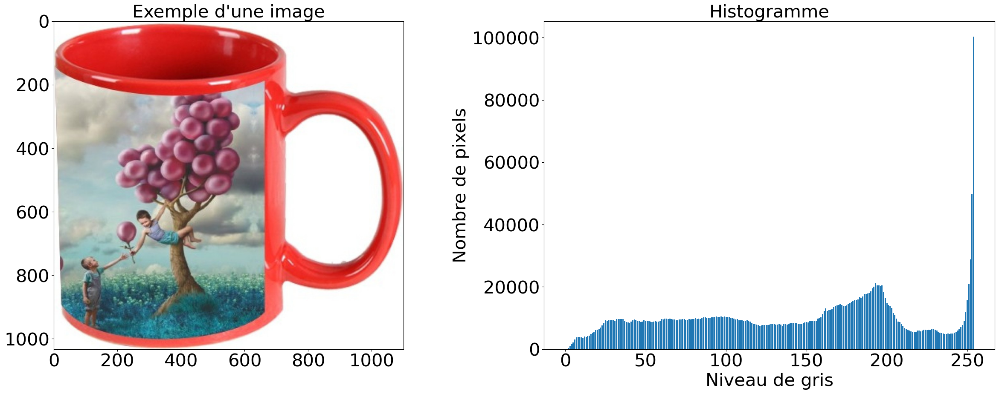

In [16]:
img_orig = Image.open(path + 'aadbc3b9c32c4535b1bfee7321c4c0e7.jpg')
img_test = img_orig

dim_test = img_test.size
plt.figure(figsize=(30, 10))
plt.subplot(121)
plt.title('Exemple d\'une image', fontsize=30)
plt.imshow(img_test, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(122)
plt.title('Histogramme', fontsize=30)
hist, bins = np.histogram(np.array(img_test).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=30)
plt.ylabel('Nombre de pixels', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

### Étirement d’histogrammes

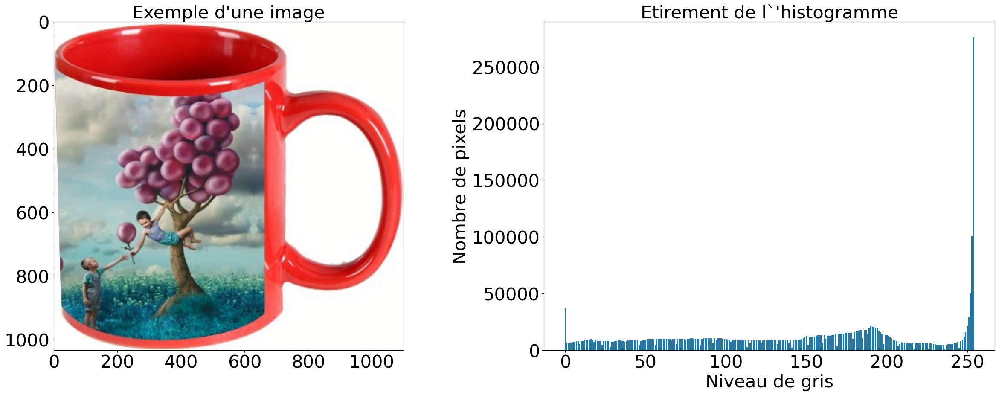

In [17]:
img_test = ImageOps.autocontrast(img_test, 1)
plt.figure(figsize=(30, 10))
plt.subplot(121)
plt.title('Exemple d\'une image', fontsize=30)
plt.imshow(img_test, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(122)
plt.title('Etirement de l`\'histogramme', fontsize=30)
hist, bins = np.histogram(np.array(img_test).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=30)
plt.ylabel('Nombre de pixels', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

### Égalisation d’histogrammes

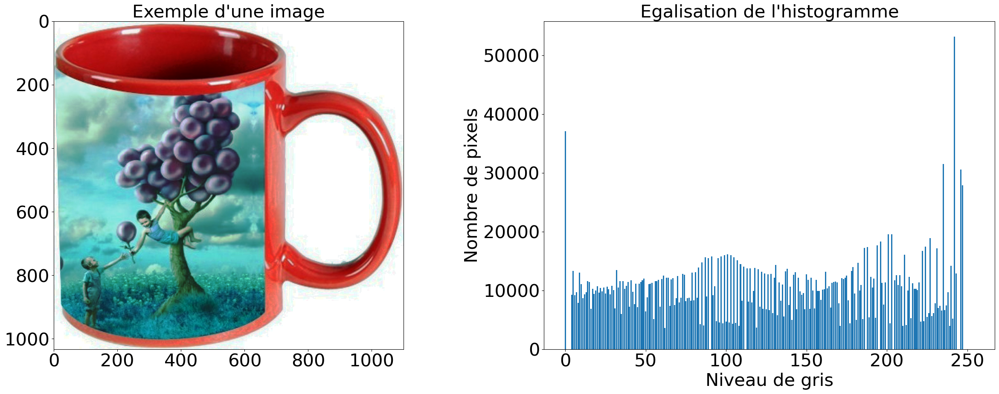

In [18]:
img_test = ImageOps.equalize(img_test)
plt.figure(figsize=(30, 10))
plt.subplot(121)
plt.title('Exemple d\'une image', fontsize=30)
plt.imshow(img_test, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(122)
plt.title('Egalisation de l\'histogramme', fontsize=30)
hist, bins = np.histogram(np.array(img_test).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=30)
plt.ylabel('Nombre de pixels', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

### Image en niveau de gris

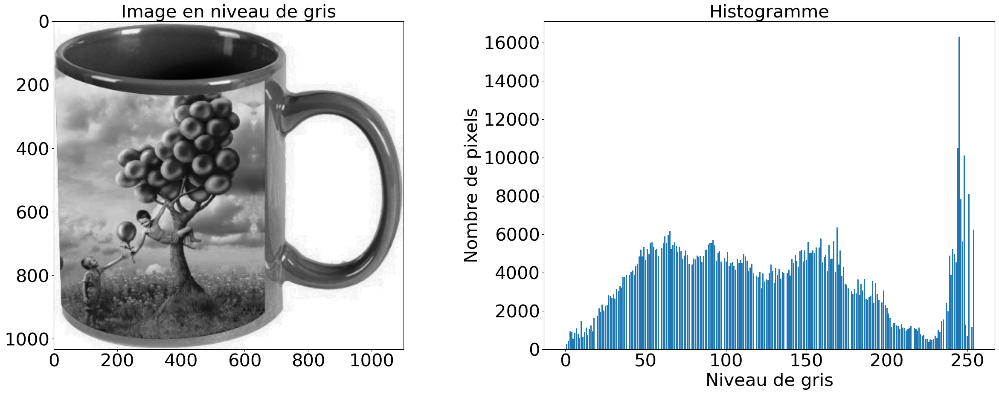

In [19]:
img_gris = cv2.cvtColor(np.array(img_test), cv2.COLOR_RGB2GRAY)
plt.figure(figsize=(30, 10))
plt.subplot(121)
plt.title('Image en niveau de gris', fontsize=30)
plt.imshow(img_gris, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(122)
plt.title('Histogramme', fontsize=30)
hist, bins = np.histogram(np.array(img_gris).flatten(), bins=256)
plt.bar(range(len(hist[0:255])), hist[0:255])
plt.xlabel('Niveau de gris', fontsize=30)
plt.ylabel('Nombre de pixels', fontsize=30)
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

### Élimination du bruit

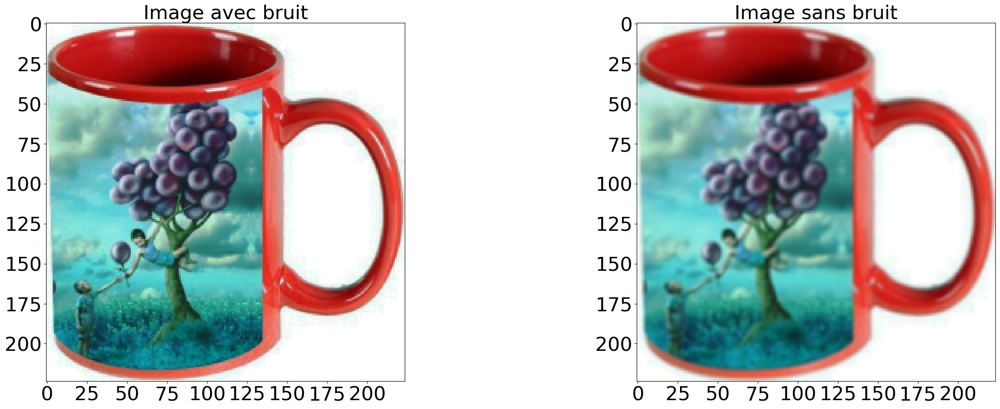

In [20]:
img_test = cv2.resize(np.array(img_test), (224, 224),
                            interpolation=cv2.INTER_AREA)
img_test = Image.fromarray(img_test, 'RGB')
img_bruit = img_test.filter(ImageFilter.BoxBlur(1))

plt.figure(figsize=(30, 10))
plt.subplot(121)
plt.title('Image avec bruit', fontsize=30)
plt.imshow(img_test, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(122)
plt.title('Image sans bruit', fontsize=30)
plt.imshow(img_bruit, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

### Redimensionnement

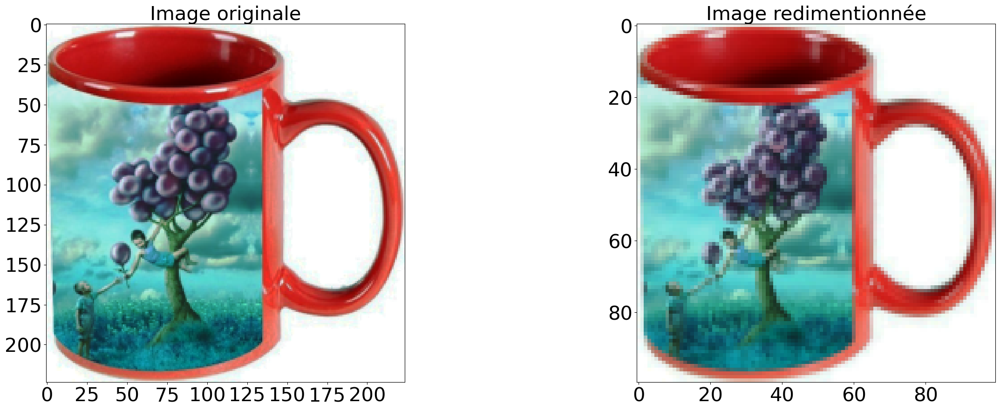

In [21]:
img_redim = cv2.resize(np.array(img_test), (100, 100),
                             interpolation=cv2.INTER_AREA)
plt.figure(figsize=(30, 10))
plt.subplot(121)
plt.title('Image originale', fontsize=30)
plt.imshow(img_test, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)

plt.subplot(122)
plt.title('Image redimentionnée', fontsize=30)
plt.imshow(img_redim, cmap='gray')
plt.xticks(fontsize=30)
plt.yticks(fontsize=30)
plt.show()

## SIFT

Détermination et affichage des descripteurs SIFT

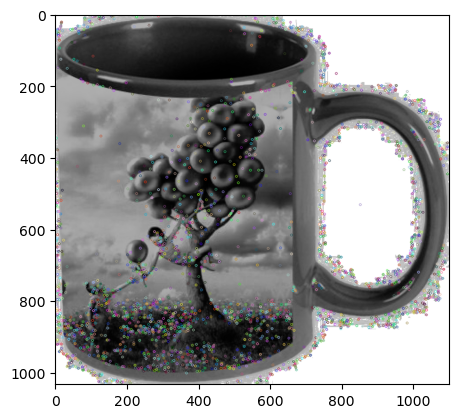

Descripteurs :  (3028, 128)

[[  0.   0.   0. ...  72.   6.   1.]
 [ 37.  14.   6. ...   0.   0.   0.]
 [ 97.  13.   9. ...   0.   0.   0.]
 ...
 [  5.  74.  31. ...   0.   0.   0.]
 [ 66.   0.   0. ...   0.   0.   0.]
 [  0.   0.   0. ... 120.   4.   5.]]


In [22]:
img_test = path + 'aadbc3b9c32c4535b1bfee7321c4c0e7.jpg'
sift = cv2.xfeatures2d.SIFT_create()
image = cv2.imread(img_test,0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)
plt.imshow(img)
plt.show()
print("Descripteurs : ", des.shape)
print()
print(des)

Créations des descripteurs de chaque image
* Pour chaque image passage en gris et equalisation
* création d'une liste de descripteurs par image ("sift_keypoints_by_img") qui sera utilisée pour réaliser les histogrammes par image
* création d'une liste de descripteurs pour l'ensemble des images ("sift_keypoints_all") qui sera utilisé pour créer les clusters de descripteurs

In [23]:
list_photos = data_netoyee['image'].values.tolist()

In [24]:
'''
# identification of key points and associated descriptors
import time, cv2
sift_keypoints = []
temps1=time.time()
sift = cv2.xfeatures2d.SIFT_create()

for image_num in range(len(list_photos)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)
    

sift_keypoints_by_img = sift_keypoints
#sift_keypoints_by_img = np.asarray(sift_keypoints)

sift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)

#del sift_keypoints_by_img

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")
'''

'\n# identification of key points and associated descriptors\nimport time, cv2\nsift_keypoints = []\ntemps1=time.time()\nsift = cv2.xfeatures2d.SIFT_create()\n\nfor image_num in range(len(list_photos)) :\n    if image_num%100 == 0 : print(image_num)\n    image = cv2.imread(path+list_photos[image_num],0) # convert in gray\n    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)\n    res = cv2.equalizeHist(image)   # equalize image histogram\n    kp, des = sift.detectAndCompute(res, None)\n    sift_keypoints.append(des)\n    \n\nsift_keypoints_by_img = sift_keypoints\n#sift_keypoints_by_img = np.asarray(sift_keypoints)\n\nsift_keypoints_all    = np.concatenate(sift_keypoints_by_img, axis=0)\n\n#del sift_keypoints_by_img\n\nprint()\nprint("Nombre de descripteurs : ", sift_keypoints_all.shape)\n\nduration1=time.time()-temps1\nprint("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")\n'

Le calcul des descripteurs sift (code dans la cellule précédente) prend du temps. J'ai préféré calculer ces descripteurs et les enregistrer une fois pour toute.

In [25]:
#np.save('sift_keypoints_by_img.npy', sift_keypoints_by_img) # save

In [26]:
sift_keypoints_by_img = np.load('sift_keypoints_by_img.npy', allow_pickle=True) # save

In [27]:
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

 Création des clusters de descripteurs
* Utilisation de MiniBatchKMeans pour obtenir des temps de traitement raisonnables

In [28]:
# Determination number of clusters
temps1=time.time()

#k = int(round(np.sqrt(len(sift_keypoints_all)),0))
# k = nbre_categorie*10=70
k = 70
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=42)

kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  70
Création de 70 clusters de descripteurs ...
temps de traitement kmeans :           104.89 secondes


 Création des features des images
* Pour chaque image : 
   - prédiction des numéros de cluster de chaque descripteur
   - création d'un histogramme = comptage pour chaque numéro de cluster du nombre de descripteurs de l'image
   
  Features d'une image = Histogramme d'une image = Comptage pour une image du nombre de descripteurs par cluster

In [29]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :            15.41 secondes


 Réductions de dimension

Réduction de dimension PCA
* La réduction PCA permet de créer des features décorrélées entre elles, et de diminuer leur dimension, tout en gardant un niveau de variance expliquée élevé (99%)
* L'impact est une meilleure séparation des données via le T-SNE et une réduction du temps de traitement du T-SNE

In [30]:
def reduction_pca(numpy_tab):
    print("Dimensions dataset avant réduction PCA : ", numpy_tab.shape)
    pca = decomposition.PCA(n_components=0.99)
    feat_pca = pca.fit_transform(numpy_tab)
    print("Dimensions dataset après réduction PCA : ", feat_pca.shape)
    return feat_pca

def reduction_tsne(data, perp):
    tsne = manifold.TSNE(n_components=2, perplexity=perp, 
                     n_iter=2000, init='random',learning_rate=200, random_state=42)
    X_tsne = tsne.fit_transform(data)

    df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
    df_tsne["class"] = data_netoyee["categorie"]
    #print(df_tsne.shape)
    return df_tsne

In [31]:
# Calcul Tsne, détermination des clusters
def clustering_tsne(df_tsne) :
       
    # Détermination des clusters à partir des données après Tsne 
    X_tsne = df_tsne[['tsne1', 'tsne2']].to_numpy()

    cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)
    cls.fit(X_tsne)
    labels_pred = cls.labels_
    df_tsne["cluster"] = labels_pred
    return labels_pred

# visualisation du Tsne selon les vraies catégories et selon les clusters
def TSNE_visu(df_tsne, labels_true, labels_pred) :
    X_tsne = df_tsne[['tsne1', 'tsne2']].to_numpy()
    fig = plt.figure(figsize=(20,10))
    
    ax = fig.add_subplot(121)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels_true, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=liste_categ, loc="best", title="Categorie")
    plt.title('Représentation des catégories par catégories réelles')
    
    ax = fig.add_subplot(122)
    scatter = ax.scatter(X_tsne[:,0],X_tsne[:,1], c=labels_pred, cmap='Set1')
    ax.legend(handles=scatter.legend_elements()[0], labels=set(labels_pred), loc="best", title="Clusters")
    plt.title('Représentation des catégories par clusters')
    
    plt.show()

In [32]:
feat_pca = reduction_pca(im_features)

Dimensions dataset avant réduction PCA :  (1050, 70)
Dimensions dataset après réduction PCA :  (1050, 50)


In [33]:
labels_true = data_netoyee["label"]
num_labels = 7
liste_categ = set(data_netoyee['categorie'])

In [34]:
df_tsne = reduction_tsne(feat_pca, 20)

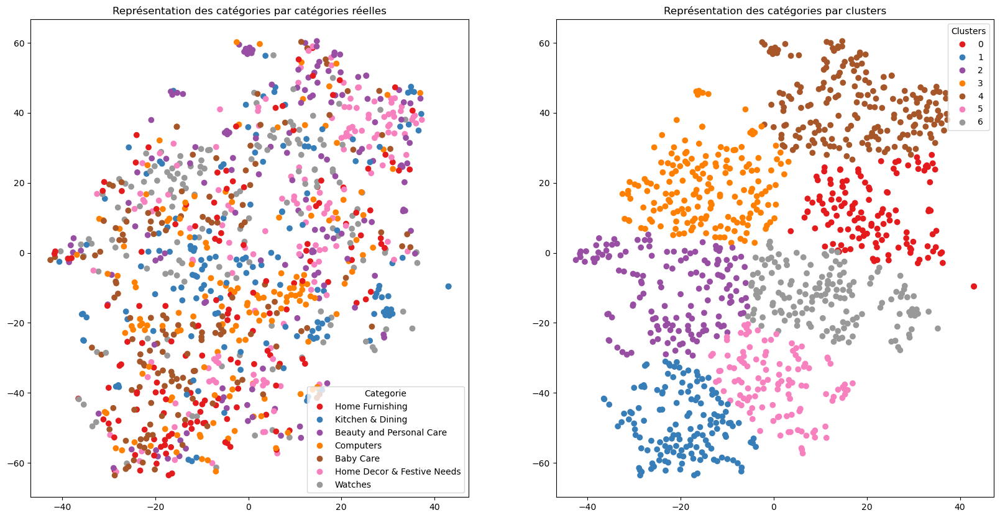

In [35]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

Calcul des métriques

In [36]:
dataframe_metrique = pd.DataFrame( columns=['Methode', 'ARI', 'homogeneity', 'completeness', 'v_measure'])

In [37]:
def calcul_metrics_clustering(labels_true, labels_pred, methode):
    ari = np.round(metrics.adjusted_rand_score(labels_true, labels_pred), 4)
    homogeneity = np.round(metrics.homogeneity_score(labels_true, labels_pred), 4)
    completeness = np.round(metrics.completeness_score(labels_true, labels_pred), 4)
    v_measure = np.round(metrics.v_measure_score(labels_true, labels_pred), 4)
    metrique = {
                'Methode': methode,
                'ARI': ari,
                'homogeneity': homogeneity,
                'completeness':completeness,
                'v_measure': v_measure
                }

    return metrique

In [38]:
metrique_sift = calcul_metrics_clustering(labels_true, labels_pred, 'sift')

In [39]:
dataframe_metrique = dataframe_metrique.append(metrique_sift, ignore_index=True)

In [40]:
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716


In [41]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    129
1    142
2    145
3    176
4    192
5    116
6    150
Name: class, dtype: int64

In [42]:
conf_mat = metrics.confusion_matrix(labels_true, labels_pred)

In [43]:
 def showconfusionmatrix(conf_mat):
        
        list_labels = data_netoyee['categorie'].unique().tolist()
        df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
        plt.figure(figsize = (6,4))
        plt.title('Confusion matrix')
        sns.heatmap(df_cm, annot=True, cmap="Blues")

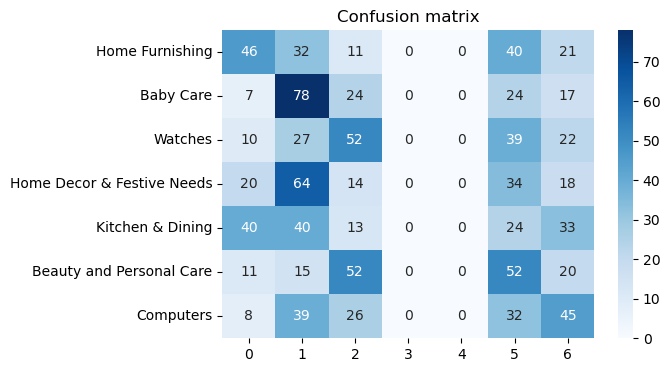

In [44]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
    corresp = np.argmax(conf_mat, axis=0)
    #corresp = [6, 0, 5, 1, 3, 4, 2]
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

## ORB

In [45]:
'''
# identification of key points and associated descriptors
import time, cv2
orb_keypoints = []
temps1=time.time()
orb = cv2.ORB_create()

for image_num in range(len(list_photos)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread(path+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = orb.detectAndCompute(res, None)
    orb_keypoints.append(des)
    #del kp, des ,res

orb_keypoints_by_img = np.asarray(orb_keypoints)
orb_keypoints_all    = np.concatenate(orb_keypoints_by_img, axis=0)
#del orb_keypoints_by_img

print()
print("Nombre de descripteurs : ",orb_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement orb descriptor : ", "%15.2f" % duration1, "secondes")
'''

'\n# identification of key points and associated descriptors\nimport time, cv2\norb_keypoints = []\ntemps1=time.time()\norb = cv2.ORB_create()\n\nfor image_num in range(len(list_photos)) :\n    if image_num%100 == 0 : print(image_num)\n    image = cv2.imread(path+list_photos[image_num],0) # convert in gray\n    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)\n    res = cv2.equalizeHist(image)   # equalize image histogram\n    kp, des = orb.detectAndCompute(res, None)\n    orb_keypoints.append(des)\n    #del kp, des ,res\n\norb_keypoints_by_img = np.asarray(orb_keypoints)\norb_keypoints_all    = np.concatenate(orb_keypoints_by_img, axis=0)\n#del orb_keypoints_by_img\n\nprint()\nprint("Nombre de descripteurs : ",orb_keypoints_all.shape)\n\nduration1=time.time()-temps1\nprint("temps de traitement orb descriptor : ", "%15.2f" % duration1, "secondes")\n'

In [46]:
#np.save('orb_keypoints_by_img.npy', orb_keypoints_by_img) # save

In [47]:
orb_keypoints_by_img = np.load('orb_keypoints_by_img.npy', allow_pickle=True) # save

In [48]:
orb_keypoints_all = np.concatenate(orb_keypoints_by_img, axis=0)

In [49]:
from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(np.concatenate(orb_keypoints_by_img, axis=0))),0))
# k = nbre_categorie*10=70
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = cluster.MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=42)
kmeans.fit(orb_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  721
Création de 721 clusters de descripteurs ...
temps de traitement kmeans :            15.39 secondes


In [50]:
# Creation of histograms (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(orb_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             9.65 secondes


In [51]:
feat_pca = reduction_pca(im_features)

Dimensions dataset avant réduction PCA :  (1050, 721)
Dimensions dataset après réduction PCA :  (1050, 579)


In [52]:
df_tsne = reduction_tsne(feat_pca, 20)

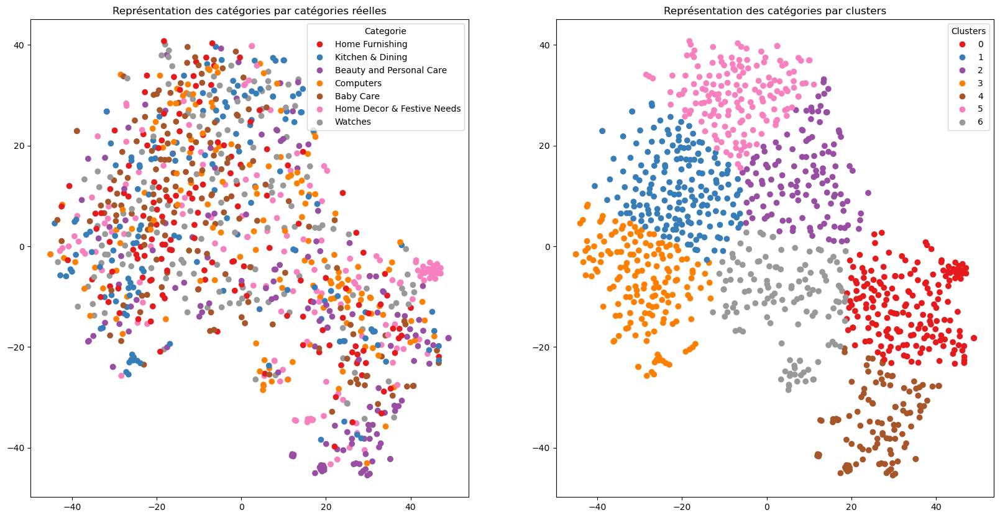

In [53]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [54]:
metrique_orb = calcul_metrics_clustering(labels_true, labels_pred, 'orb')
dataframe_metrique = dataframe_metrique.append(metrique_orb, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582


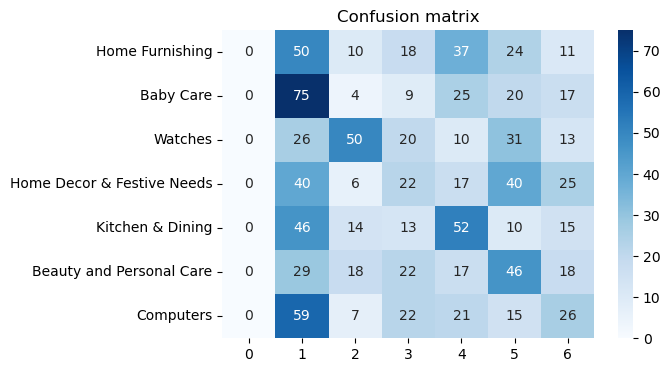

In [55]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

In [56]:
del orb_keypoints_all, sift_keypoints_all, orb_keypoints_by_img, sift_keypoints_by_img

## Transfer Learning

In [57]:
from tensorflow.keras import applications

In [58]:
dir(applications)

['ConvNeXtBase',
 'ConvNeXtLarge',
 'ConvNeXtSmall',
 'ConvNeXtTiny',
 'ConvNeXtXLarge',
 'DenseNet121',
 'DenseNet169',
 'DenseNet201',
 'EfficientNetB0',
 'EfficientNetB1',
 'EfficientNetB2',
 'EfficientNetB3',
 'EfficientNetB4',
 'EfficientNetB5',
 'EfficientNetB6',
 'EfficientNetB7',
 'EfficientNetV2B0',
 'EfficientNetV2B1',
 'EfficientNetV2B2',
 'EfficientNetV2B3',
 'EfficientNetV2L',
 'EfficientNetV2M',
 'EfficientNetV2S',
 'InceptionResNetV2',
 'InceptionV3',
 'MobileNet',
 'MobileNetV2',
 'MobileNetV3Large',
 'MobileNetV3Small',
 'NASNetLarge',
 'NASNetMobile',
 'RegNetX002',
 'RegNetX004',
 'RegNetX006',
 'RegNetX008',
 'RegNetX016',
 'RegNetX032',
 'RegNetX040',
 'RegNetX064',
 'RegNetX080',
 'RegNetX120',
 'RegNetX160',
 'RegNetX320',
 'RegNetY002',
 'RegNetY004',
 'RegNetY006',
 'RegNetY008',
 'RegNetY016',
 'RegNetY032',
 'RegNetY040',
 'RegNetY064',
 'RegNetY080',
 'RegNetY120',
 'RegNetY160',
 'RegNetY320',
 'ResNet101',
 'ResNet101V2',
 'ResNet152',
 'ResNet152V2',
 'Re

### VGG16

In [59]:
def transfer_learn(model):



	# Liste
	model_all_features = []

	# Instanciation du modèle
	model_learn = model
	# Résumé de l'architecture du modèle
	model_learn.summary()

	for image_num in list_photos:
		image_num = path+image_num
		# Charger l'image et la redimensionner à la taille
		# requise de 224×224 pixels.
		img = keras.preprocessing.image.load_img(image_num, target_size=(224, 224))
		# Convertir les pixels en un tableau NumPy afin de pouvoir travailler
		# avec dans Keras
		img = keras.preprocessing.image.img_to_array(img)
		# Redimensionnement
		img = np.expand_dims(img, axis=0)
		# Préparer de nouvelles entrées pour le réseau.
		img = preprocess_input(img)

		# obtenir une prédiction de la probabilité d'appartenance
		# de l'image à chacun des 1000 types d'objets connus.
		model_feature = model_learn.predict(img)
		# Ajouter la feature prédite en nparray à la liste
		model_all_features.append(np.array(model_feature).flatten())

	model_all_features = np.array(model_all_features)
	return model_all_features

In [60]:
model = VGG16(weights='imagenet', include_top=False)
vgg16_all_features = transfer_learn(model)

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, None, None, 3)]   0         
                                                                 
 block1_conv1 (Conv2D)       (None, None, None, 64)    1792      
                                                                 
 block1_conv2 (Conv2D)       (None, None, None, 64)    36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, None, None, 64)    0         
                                                                 
 block2_conv1 (Conv2D)       (None, None, None, 128)   73856     
                                                                 
 block2_conv2 (Conv2D)       (None, None, None, 128)   147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, None, None, 128)   0     

1/1 [==============================] - 0s 187ms/step


1/1 [==============================] - 0s 219ms/step


1/1 [==============================] - 0s 273ms/step


In [61]:
def optimisation_perplexity(data, liste_perp):
    for perp in liste_perp:
        tsne = manifold.TSNE(n_components=2, perplexity=perp, 
                             n_iter=2000, init='random', learning_rate=200, random_state=42)
        X_tsne = tsne.fit_transform(data)

        df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
        df_tsne["class"] = data_netoyee["categorie"]
        cls = cluster.KMeans(n_clusters=num_labels, n_init=100, random_state=42)

        cls.fit(X_tsne)
        df_tsne["cluster"] = cls.labels_
        print("perplexity : ", perp, '-------', "ARI : ", np.round(metrics.adjusted_rand_score(labels_true, cls.labels_), 4))

In [62]:
feat_pca = reduction_pca(vgg16_all_features)

Dimensions dataset avant réduction PCA :  (1050, 25088)
Dimensions dataset après réduction PCA :  (1050, 947)


In [63]:
liste_perp = [10, 20, 30, 40, 50]
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.3135
perplexity :  20 ------- ARI :  0.3311
perplexity :  30 ------- ARI :  0.3369
perplexity :  40 ------- ARI :  0.3521
perplexity :  50 ------- ARI :  0.3307


In [64]:
df_tsne = reduction_tsne(feat_pca, 40)

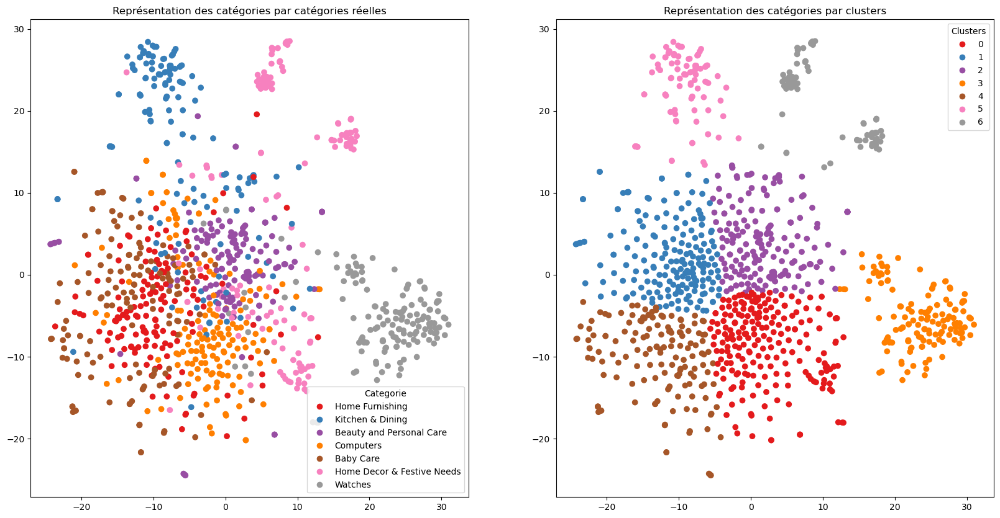

In [65]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [66]:
metrique_vgg16 = calcul_metrics_clustering(labels_true, labels_pred, 'vgg16')
dataframe_metrique = dataframe_metrique.append(metrique_vgg16, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661


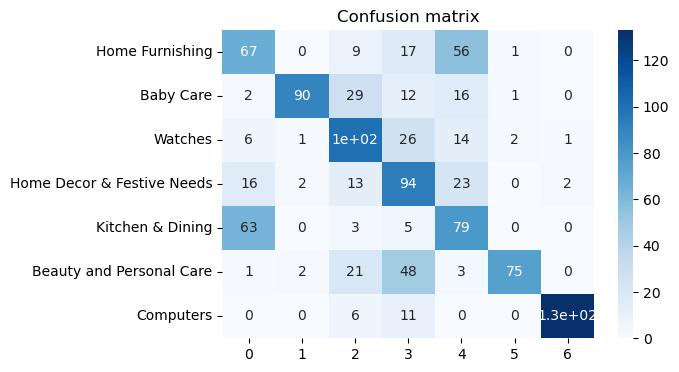

In [67]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

In [68]:
def taille_cluster(labels):
    #global cluster_size
    cluster_size = {}
    for i in labels:
        if i not in cluster_size:
            cluster_size[i] = 1
        else:
            cluster_size[i] += 1

    fig = plt.figure(figsize=[8, 8])
    fig.patch.set_alpha(0.7)
    plt.title("Clusters size ")
    plt.bar(range(0, len(cluster_size)), cluster_size.values())
    for i, num in enumerate(cluster_size.keys()):
        height = cluster_size[num]+20
        x = i - 0.25
        pourcent = cluster_size[num]/labels.shape[0]*100
        plt.text(x, height, "{} % ".format(round(pourcent, 2)))
    plt.xticks(range(0, len(cluster_size)), cluster_size.keys())

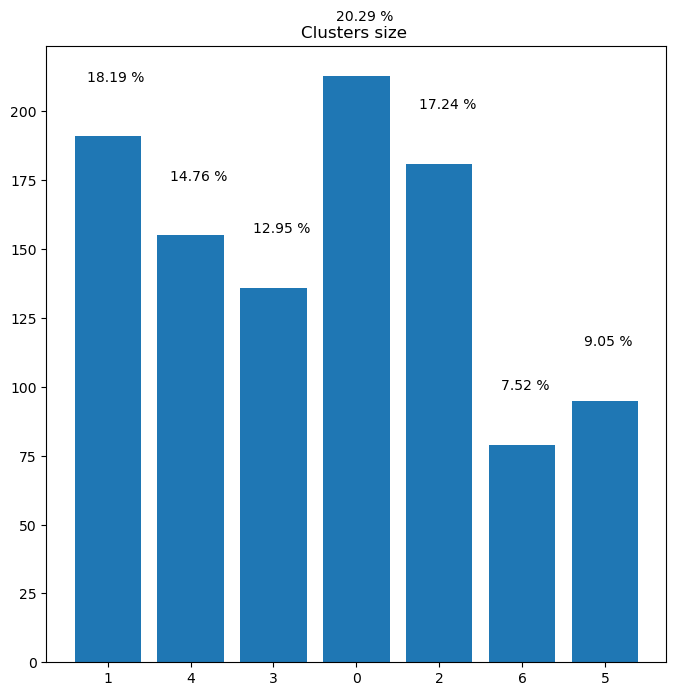

In [69]:
taille_cluster(df_tsne["cluster"])

In [70]:
# Les catégories par clusters
df_tsne.groupby('cluster')['class'].value_counts(). \
    to_frame()

class
cluster class                            
0       Home Decor & Festive Needs     94
        Kitchen & Dining               48
        Computers                      26
        Baby Care                      17
        Beauty and Personal Care       12
        Watches                        11
        Home Furnishing                 5
1       Home Furnishing                79
        Baby Care                      56
        Home Decor & Festive Needs     23
        Beauty and Personal Care       16
        Computers                      14
        Kitchen & Dining                3
2       Computers                     100
        Beauty and Personal Care       29
        Kitchen & Dining               21
        Home Decor & Festive Needs     13
        Baby Care                       9
        Watches                         6
        Home Furnishing                 3
3       Watches                       133
        Home Decor & Festive Needs      2
        Computers                       1
4       Baby Care                      67
        Home Furnishing                63
        Home Decor & Festive Needs     16
        Computers                       6
        Beauty and Personal Care        2
        Kitchen & Dining                1
5       Beauty and Personal Care       90
        Home Decor & Festive Needs      2
        Kitchen & Dining                2
        Computers                       1
6       Kitchen & Dining               75
        Computers                       2
        Baby Care                       1
        Beauty and Personal Care        1

### MobileNetV2

In [71]:
model = MobileNetV2(weights='imagenet', include_top=False)
mob_all_features = transfer_learn(model)

Model: "mobilenetv2_1.00_224"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 Conv1 (Conv2D)                 (None, None, None,   864         ['input_2[0][0]']                
                                32)                                                               
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, None, None,   128         ['Conv1[0][0]']                  
                                32)                                            

 block_2_add (Add)              (None, None, None,   0           ['block_1_project_BN[0][0]',     
                                24)                               'block_2_project_BN[0][0]']     
                                                                                                  
 block_3_expand (Conv2D)        (None, None, None,   3456        ['block_2_add[0][0]']            
                                144)                                                              
                                                                                                  
 block_3_expand_BN (BatchNormal  (None, None, None,   576        ['block_3_expand[0][0]']         
 ization)                       144)                                                              
                                                                                                  
 block_3_expand_relu (ReLU)     (None, None, None,   0           ['block_3_expand_BN[0][0]']      
          

                                                                                                  
 block_6_expand (Conv2D)        (None, None, None,   6144        ['block_5_add[0][0]']            
                                192)                                                              
                                                                                                  
 block_6_expand_BN (BatchNormal  (None, None, None,   768        ['block_6_expand[0][0]']         
 ization)                       192)                                                              
                                                                                                  
 block_6_expand_relu (ReLU)     (None, None, None,   0           ['block_6_expand_BN[0][0]']      
                                192)                                                              
                                                                                                  
 block_6_p

                                384)                                                              
                                                                                                  
 block_9_expand_BN (BatchNormal  (None, None, None,   1536       ['block_9_expand[0][0]']         
 ization)                       384)                                                              
                                                                                                  
 block_9_expand_relu (ReLU)     (None, None, None,   0           ['block_9_expand_BN[0][0]']      
                                384)                                                              
                                                                                                  
 block_9_depthwise (DepthwiseCo  (None, None, None,   3456       ['block_9_expand_relu[0][0]']    
 nv2D)                          384)                                                              
          

 block_12_expand_relu (ReLU)    (None, None, None,   0           ['block_12_expand_BN[0][0]']     
                                576)                                                              
                                                                                                  
 block_12_depthwise (DepthwiseC  (None, None, None,   5184       ['block_12_expand_relu[0][0]']   
 onv2D)                         576)                                                              
                                                                                                  
 block_12_depthwise_BN (BatchNo  (None, None, None,   2304       ['block_12_depthwise[0][0]']     
 rmalization)                   576)                                                              
                                                                                                  
 block_12_depthwise_relu (ReLU)  (None, None, None,   0          ['block_12_depthwise_BN[0][0]']  
          

                                                                                                  
 block_15_depthwise (DepthwiseC  (None, None, None,   8640       ['block_15_expand_relu[0][0]']   
 onv2D)                         960)                                                              
                                                                                                  
 block_15_depthwise_BN (BatchNo  (None, None, None,   3840       ['block_15_depthwise[0][0]']     
 rmalization)                   960)                                                              
                                                                                                  
 block_15_depthwise_relu (ReLU)  (None, None, None,   0          ['block_15_depthwise_BN[0][0]']  
                                960)                                                              
                                                                                                  
 block_15_

1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 62ms/step


1/1 [==============================] - 0s 94ms/step


In [72]:
feat_pca = reduction_pca(mob_all_features)

Dimensions dataset avant réduction PCA :  (1050, 62720)
Dimensions dataset après réduction PCA :  (1050, 985)


In [73]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.2802
perplexity :  20 ------- ARI :  0.2984
perplexity :  30 ------- ARI :  0.3176
perplexity :  40 ------- ARI :  0.307
perplexity :  50 ------- ARI :  0.2716


In [74]:
df_tsne = reduction_tsne(feat_pca, 30)

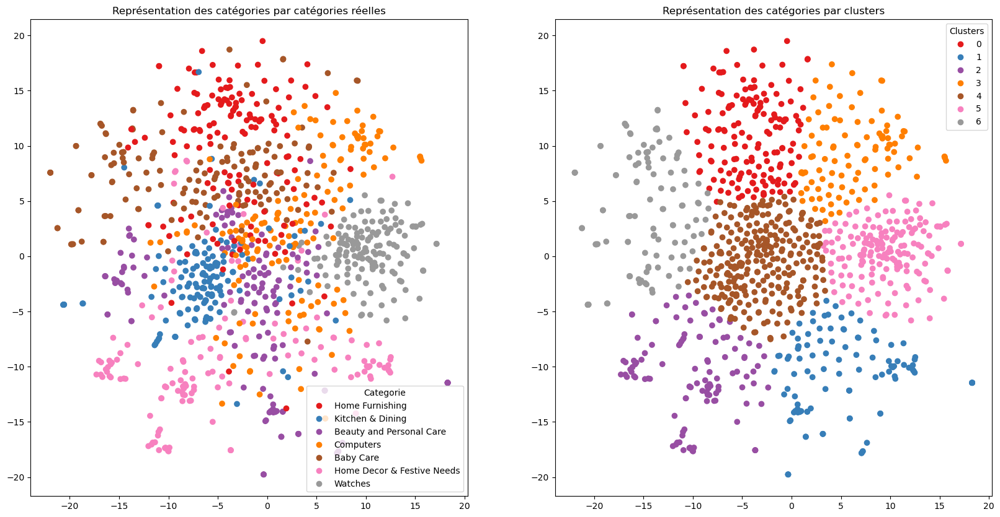

In [75]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [76]:
metrique_mobnet = calcul_metrics_clustering(labels_true, labels_pred, 'mobnet')
dataframe_metrique = dataframe_metrique.append(metrique_mobnet, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136


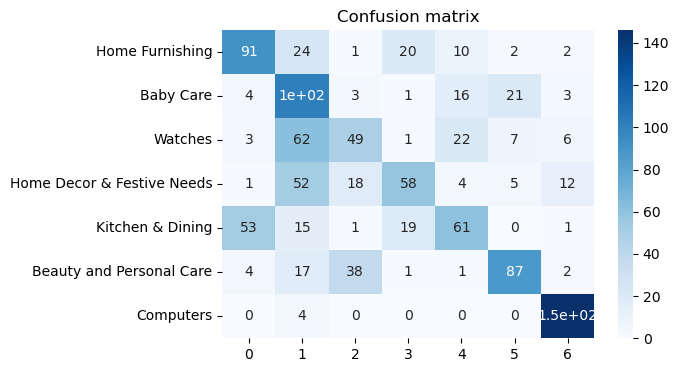

In [77]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

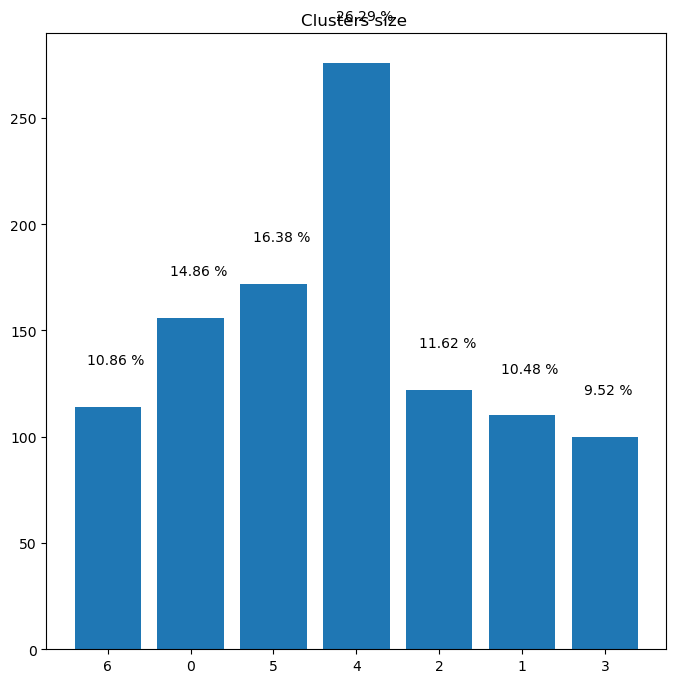

In [78]:
taille_cluster(df_tsne["cluster"])

In [79]:
# Les catégories par clusters
df_tsne.groupby('cluster')['class'].value_counts(). \
    to_frame()

class
cluster class                            
0       Baby Care                      91
        Home Furnishing                53
        Beauty and Personal Care        4
        Kitchen & Dining                4
        Computers                       3
        Home Decor & Festive Needs      1
1       Computers                      49
        Kitchen & Dining               38
        Home Decor & Festive Needs     18
        Beauty and Personal Care        3
        Baby Care                       1
        Home Furnishing                 1
2       Kitchen & Dining               87
        Beauty and Personal Care       21
        Computers                       7
        Home Decor & Festive Needs      5
        Baby Care                       2
3       Home Decor & Festive Needs     58
        Baby Care                      20
        Home Furnishing                19
        Beauty and Personal Care        1
        Computers                       1
        Kitchen & Dining                1
4       Beauty and Personal Care      102
        Computers                      62
        Home Decor & Festive Needs     52
        Baby Care                      24
        Kitchen & Dining               17
        Home Furnishing                15
        Watches                         4
5       Watches                       146
        Home Decor & Festive Needs     12
        Computers                       6
        Beauty and Personal Care        3
        Baby Care                       2
        Kitchen & Dining                2
        Home Furnishing                 1
6       Home Furnishing                61
        Computers                      22
        Beauty and Personal Care       16
        Baby Care                      10
        Home Decor & Festive Needs      4
        Kitchen & Dining                1

### InceptionV3

In [80]:
model = InceptionV3(weights='imagenet', include_top=False)
incep_all_features = transfer_learn(model)

Model: "inception_v3"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d (Conv2D)                (None, None, None,   864         ['input_3[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization (BatchNorm  (None, None, None,   96         ['conv2d[0][0]']                 
 alization)                     32)                                                    

                                                                                                  
 average_pooling2d (AveragePool  (None, None, None,   0          ['max_pooling2d_1[0][0]']        
 ing2D)                         192)                                                              
                                                                                                  
 conv2d_5 (Conv2D)              (None, None, None,   12288       ['max_pooling2d_1[0][0]']        
                                64)                                                               
                                                                                                  
 conv2d_7 (Conv2D)              (None, None, None,   76800       ['activation_6[0][0]']           
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 conv2d_18 (Conv2D)             (None, None, None,   16384       ['average_pooling2d_1[0][0]']    
                                64)                                                               
                                                                                                  
 batch_normalization_12 (BatchN  (None, None, None,   192        ['conv2d_12[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_normalization_14 (BatchN  (None, None, None,   192        ['conv2d_14[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 batch_nor

                                                                                                  
 batch_normalization_25 (BatchN  (None, None, None,   192        ['conv2d_25[0][0]']              
 ormalization)                  64)                                                               
                                                                                                  
 activation_19 (Activation)     (None, None, None,   0           ['batch_normalization_19[0][0]'] 
                                64)                                                               
                                                                                                  
 activation_21 (Activation)     (None, None, None,   0           ['batch_normalization_21[0][0]'] 
                                64)                                                               
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_36 (Conv2D)             (None, None, None,   114688      ['activation_35[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_31 (BatchN  (None, None, None,   384        ['conv2d_31[0][0]']              
 ormalization)                  128)                                                              
                                                                                                  
 batch_normalization_36 (BatchN  (None, None, None,   384        ['conv2d_36[0][0]']              
 ormalization)                  128)                                                              
          

 ormalization)                  160)                                                              
                                                                                                  
 activation_44 (Activation)     (None, None, None,   0           ['batch_normalization_44[0][0]'] 
                                160)                                                              
                                                                                                  
 conv2d_45 (Conv2D)             (None, None, None,   179200      ['activation_44[0][0]']          
                                160)                                                              
                                                                                                  
 batch_normalization_45 (BatchN  (None, None, None,   480        ['conv2d_45[0][0]']              
 ormalization)                  160)                                                              
          

 activation_48 (Activation)     (None, None, None,   0           ['batch_normalization_48[0][0]'] 
                                192)                                                              
                                                                                                  
 activation_49 (Activation)     (None, None, None,   0           ['batch_normalization_49[0][0]'] 
                                192)                                                              
                                                                                                  
 mixed5 (Concatenate)           (None, None, None,   0           ['activation_40[0][0]',          
                                768)                              'activation_43[0][0]',          
                                                                  'activation_48[0][0]',          
                                                                  'activation_49[0][0]']          
          

 batch_normalization_53 (BatchN  (None, None, None,   576        ['conv2d_53[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_58 (BatchN  (None, None, None,   576        ['conv2d_58[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 batch_normalization_59 (BatchN  (None, None, None,   576        ['conv2d_59[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_50 (Activation)     (None, None, None,   0           ['batch_normalization_50[0][0]'] 
          

 conv2d_60 (Conv2D)             (None, None, None,   147456      ['mixed6[0][0]']                 
                                192)                                                              
                                                                                                  
 conv2d_63 (Conv2D)             (None, None, None,   258048      ['activation_62[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_68 (Conv2D)             (None, None, None,   258048      ['activation_67[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_69 (Conv2D)             (None, None, None,   147456      ['average_pooling2d_6[0][0]']    
          

 batch_normalization_71 (BatchN  (None, None, None,   960        ['conv2d_71[0][0]']              
 ormalization)                  320)                                                              
                                                                                                  
 batch_normalization_75 (BatchN  (None, None, None,   576        ['conv2d_75[0][0]']              
 ormalization)                  192)                                                              
                                                                                                  
 activation_71 (Activation)     (None, None, None,   0           ['batch_normalization_71[0][0]'] 
                                320)                                                              
                                                                                                  
 activation_75 (Activation)     (None, None, None,   0           ['batch_normalization_75[0][0]'] 
          

                                384)                                                              
                                                                                                  
 activation_79 (Activation)     (None, None, None,   0           ['batch_normalization_79[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_82 (Activation)     (None, None, None,   0           ['batch_normalization_82[0][0]'] 
                                384)                                                              
                                                                                                  
 activation_83 (Activation)     (None, None, None,   0           ['batch_normalization_83[0][0]'] 
                                384)                                                              
          

 ormalization)                  384)                                                              
                                                                                                  
 batch_normalization_92 (BatchN  (None, None, None,   1152       ['conv2d_92[0][0]']              
 ormalization)                  384)                                                              
                                                                                                  
 conv2d_93 (Conv2D)             (None, None, None,   393216      ['average_pooling2d_8[0][0]']    
                                192)                                                              
                                                                                                  
 batch_normalization_85 (BatchN  (None, None, None,   960        ['conv2d_85[0][0]']              
 ormalization)                  320)                                                              
          

1/1 [==============================] - 1s 907ms/step


1/1 [==============================] - 1s 892ms/step


1/1 [==============================] - 1s 859ms/step


In [81]:
feat_pca = reduction_pca(incep_all_features)

Dimensions dataset avant réduction PCA :  (1050, 51200)
Dimensions dataset après réduction PCA :  (1050, 960)


In [82]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.2063
perplexity :  20 ------- ARI :  0.2447
perplexity :  30 ------- ARI :  0.2342
perplexity :  40 ------- ARI :  0.2511
perplexity :  50 ------- ARI :  0.2562


In [83]:
df_tsne = reduction_tsne(feat_pca, 50)

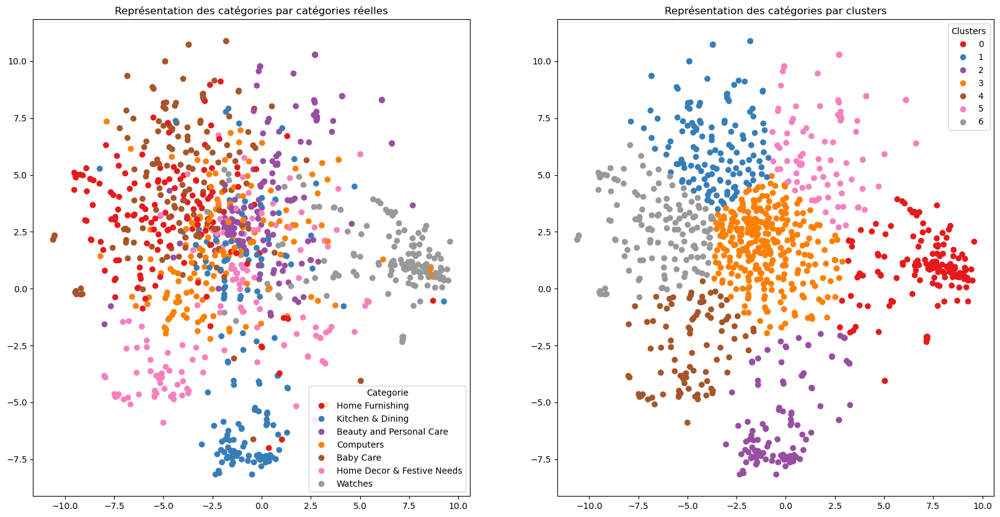

In [84]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [85]:
metrique_inception = calcul_metrics_clustering(labels_true, labels_pred, 'inception')
dataframe_metrique = dataframe_metrique.append(metrique_inception, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759


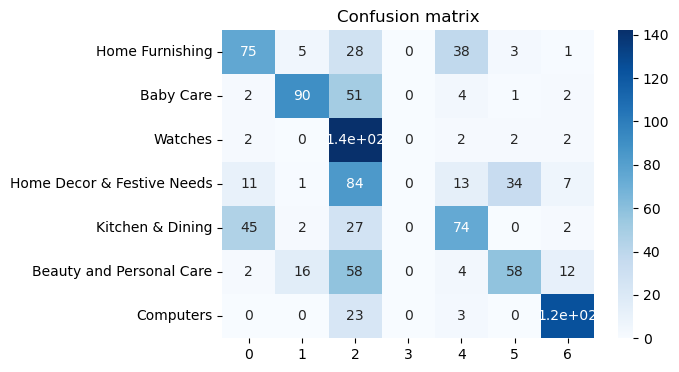

In [86]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

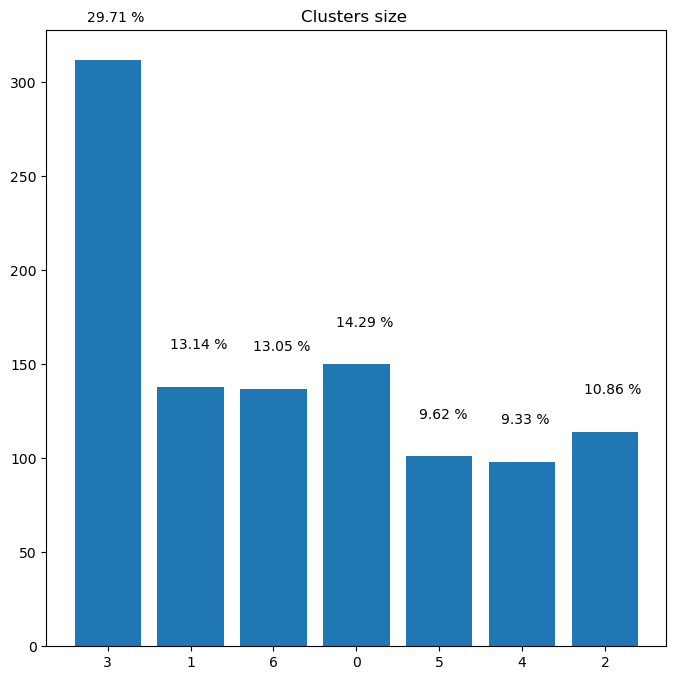

In [87]:
taille_cluster(df_tsne["cluster"])

In [88]:
# Les catégories par clusters
df_tsne.groupby('cluster')['class'].value_counts(). \
    to_frame()

class
cluster class                            
0       Watches                       124
        Kitchen & Dining               12
        Home Decor & Festive Needs      7
        Beauty and Personal Care        2
        Computers                       2
        Home Furnishing                 2
        Baby Care                       1
1       Home Furnishing                74
        Baby Care                      38
        Home Decor & Festive Needs     13
        Beauty and Personal Care        4
        Kitchen & Dining                4
        Watches                         3
        Computers                       2
2       Beauty and Personal Care       90
        Kitchen & Dining               16
        Baby Care                       5
        Home Furnishing                 2
        Home Decor & Festive Needs      1
3       Computers                      79
        Home Decor & Festive Needs     72
        Kitchen & Dining               52
        Beauty and Personal Care       47
        Baby Care                      26
        Home Furnishing                21
        Watches                        15
4       Kitchen & Dining               58
        Home Decor & Festive Needs     34
        Baby Care                       3
        Computers                       2
        Beauty and Personal Care        1
5       Computers                      63
        Home Decor & Festive Needs     12
        Watches                         8
        Home Furnishing                 6
        Kitchen & Dining                6
        Beauty and Personal Care        4
        Baby Care                       2
6       Baby Care                      75
        Home Furnishing                45
        Home Decor & Festive Needs     11
        Beauty and Personal Care        2
        Computers                       2
        Kitchen & Dining                2

### DenseNet

In [89]:
model = DenseNet201(weights='imagenet', include_top=False)
dense_all_features = transfer_learn(model)

Model: "densenet201"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 zero_padding2d (ZeroPadding2D)  (None, None, None,   0          ['input_4[0][0]']                
                                3)                                                                
                                                                                                  
 conv1/conv (Conv2D)            (None, None, None,   9408        ['zero_padding2d[0][0]']         
                                64)                                                     

                                                                                                  
 conv2_block3_concat (Concatena  (None, None, None,   0          ['conv2_block2_concat[0][0]',    
 te)                            160)                              'conv2_block3_2_conv[0][0]']    
                                                                                                  
 conv2_block4_0_bn (BatchNormal  (None, None, None,   640        ['conv2_block3_concat[0][0]']    
 ization)                       160)                                                              
                                                                                                  
 conv2_block4_0_relu (Activatio  (None, None, None,   0          ['conv2_block4_0_bn[0][0]']      
 n)                             160)                                                              
                                                                                                  
 conv2_blo

 n)                             128)                                                              
                                                                                                  
 conv3_block1_1_conv (Conv2D)   (None, None, None,   16384       ['conv3_block1_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block1_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block1_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block1_1_relu (Activatio  (None, None, None,   0          ['conv3_block1_1_bn[0][0]']      
 n)                             128)                                                              
          

 conv3_block5_0_relu (Activatio  (None, None, None,   0          ['conv3_block5_0_bn[0][0]']      
 n)                             256)                                                              
                                                                                                  
 conv3_block5_1_conv (Conv2D)   (None, None, None,   32768       ['conv3_block5_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block5_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block5_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_block5_1_relu (Activatio  (None, None, None,   0          ['conv3_block5_1_bn[0][0]']      
 n)       

                                                                                                  
 conv3_block9_0_relu (Activatio  (None, None, None,   0          ['conv3_block9_0_bn[0][0]']      
 n)                             384)                                                              
                                                                                                  
 conv3_block9_1_conv (Conv2D)   (None, None, None,   49152       ['conv3_block9_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv3_block9_1_bn (BatchNormal  (None, None, None,   512        ['conv3_block9_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv3_blo

                                512)                                                              
                                                                                                  
 pool3_relu (Activation)        (None, None, None,   0           ['pool3_bn[0][0]']               
                                512)                                                              
                                                                                                  
 pool3_conv (Conv2D)            (None, None, None,   131072      ['pool3_relu[0][0]']             
                                256)                                                              
                                                                                                  
 pool3_pool (AveragePooling2D)  (None, None, None,   0           ['pool3_conv[0][0]']             
                                256)                                                              
          

 conv4_block4_1_bn (BatchNormal  (None, None, None,   512        ['conv4_block4_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv4_block4_1_relu (Activatio  (None, None, None,   0          ['conv4_block4_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv4_block4_2_conv (Conv2D)   (None, None, None,   36864       ['conv4_block4_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv4_block4_concat (Concatena  (None, None, None,   0          ['conv4_block3_concat[0][0]',    
 te)      

                                                                                                  
 conv4_block8_1_bn (BatchNormal  (None, None, None,   512        ['conv4_block8_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv4_block8_1_relu (Activatio  (None, None, None,   0          ['conv4_block8_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv4_block8_2_conv (Conv2D)   (None, None, None,   36864       ['conv4_block8_1_relu[0][0]']    
                                32)                                                               
                                                                                                  
 conv4_blo

                                128)                                                              
                                                                                                  
 conv4_block12_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block12_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block12_1_relu (Activati  (None, None, None,   0          ['conv4_block12_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv4_block12_2_conv (Conv2D)  (None, None, None,   36864       ['conv4_block12_1_relu[0][0]']   
                                32)                                                               
          

 conv4_block16_1_conv (Conv2D)  (None, None, None,   94208       ['conv4_block16_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block16_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block16_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block16_1_relu (Activati  (None, None, None,   0          ['conv4_block16_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv4_block16_2_conv (Conv2D)  (None, None, None,   36864       ['conv4_block16_1_relu[0][0]']   
          

                                                                                                  
 conv4_block20_1_conv (Conv2D)  (None, None, None,   110592      ['conv4_block20_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block20_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block20_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block20_1_relu (Activati  (None, None, None,   0          ['conv4_block20_1_bn[0][0]']     
 on)                            128)                                                              
                                                                                                  
 conv4_blo

 on)                            992)                                                              
                                                                                                  
 conv4_block24_1_conv (Conv2D)  (None, None, None,   126976      ['conv4_block24_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block24_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block24_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block24_1_relu (Activati  (None, None, None,   0          ['conv4_block24_1_bn[0][0]']     
 on)                            128)                                                              
          

 conv4_block28_0_relu (Activati  (None, None, None,   0          ['conv4_block28_0_bn[0][0]']     
 on)                            1120)                                                             
                                                                                                  
 conv4_block28_1_conv (Conv2D)  (None, None, None,   143360      ['conv4_block28_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block28_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block28_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_block28_1_relu (Activati  (None, None, None,   0          ['conv4_block28_1_bn[0][0]']     
 on)      

                                                                                                  
 conv4_block32_0_relu (Activati  (None, None, None,   0          ['conv4_block32_0_bn[0][0]']     
 on)                            1248)                                                             
                                                                                                  
 conv4_block32_1_conv (Conv2D)  (None, None, None,   159744      ['conv4_block32_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block32_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block32_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv4_blo

 lization)                      1376)                                                             
                                                                                                  
 conv4_block36_0_relu (Activati  (None, None, None,   0          ['conv4_block36_0_bn[0][0]']     
 on)                            1376)                                                             
                                                                                                  
 conv4_block36_1_conv (Conv2D)  (None, None, None,   176128      ['conv4_block36_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block36_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block36_1_conv[0][0]']   
 lization)                      128)                                                              
          

 conv4_block40_0_bn (BatchNorma  (None, None, None,   6016       ['conv4_block39_concat[0][0]']   
 lization)                      1504)                                                             
                                                                                                  
 conv4_block40_0_relu (Activati  (None, None, None,   0          ['conv4_block40_0_bn[0][0]']     
 on)                            1504)                                                             
                                                                                                  
 conv4_block40_1_conv (Conv2D)  (None, None, None,   192512      ['conv4_block40_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_block40_1_bn (BatchNorma  (None, None, None,   512        ['conv4_block40_1_conv[0][0]']   
 lization)

                                                                                                  
 conv4_block44_0_bn (BatchNorma  (None, None, None,   6528       ['conv4_block43_concat[0][0]']   
 lization)                      1632)                                                             
                                                                                                  
 conv4_block44_0_relu (Activati  (None, None, None,   0          ['conv4_block44_0_bn[0][0]']     
 on)                            1632)                                                             
                                                                                                  
 conv4_block44_1_conv (Conv2D)  (None, None, None,   208896      ['conv4_block44_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv4_blo

 ate)                           1760)                             'conv4_block47_2_conv[0][0]']   
                                                                                                  
 conv4_block48_0_bn (BatchNorma  (None, None, None,   7040       ['conv4_block47_concat[0][0]']   
 lization)                      1760)                                                             
                                                                                                  
 conv4_block48_0_relu (Activati  (None, None, None,   0          ['conv4_block48_0_bn[0][0]']     
 on)                            1760)                                                             
                                                                                                  
 conv4_block48_1_conv (Conv2D)  (None, None, None,   225280      ['conv4_block48_0_relu[0][0]']   
                                128)                                                              
          

 conv5_block3_1_conv (Conv2D)   (None, None, None,   122880      ['conv5_block3_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv5_block3_1_bn (BatchNormal  (None, None, None,   512        ['conv5_block3_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv5_block3_1_relu (Activatio  (None, None, None,   0          ['conv5_block3_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv5_block3_2_conv (Conv2D)   (None, None, None,   36864       ['conv5_block3_1_relu[0][0]']    
          

                                                                                                  
 conv5_block7_1_conv (Conv2D)   (None, None, None,   139264      ['conv5_block7_0_relu[0][0]']    
                                128)                                                              
                                                                                                  
 conv5_block7_1_bn (BatchNormal  (None, None, None,   512        ['conv5_block7_1_conv[0][0]']    
 ization)                       128)                                                              
                                                                                                  
 conv5_block7_1_relu (Activatio  (None, None, None,   0          ['conv5_block7_1_bn[0][0]']      
 n)                             128)                                                              
                                                                                                  
 conv5_blo

 on)                            1216)                                                             
                                                                                                  
 conv5_block11_1_conv (Conv2D)  (None, None, None,   155648      ['conv5_block11_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_block11_1_bn (BatchNorma  (None, None, None,   512        ['conv5_block11_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv5_block11_1_relu (Activati  (None, None, None,   0          ['conv5_block11_1_bn[0][0]']     
 on)                            128)                                                              
          

 conv5_block15_0_relu (Activati  (None, None, None,   0          ['conv5_block15_0_bn[0][0]']     
 on)                            1344)                                                             
                                                                                                  
 conv5_block15_1_conv (Conv2D)  (None, None, None,   172032      ['conv5_block15_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_block15_1_bn (BatchNorma  (None, None, None,   512        ['conv5_block15_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv5_block15_1_relu (Activati  (None, None, None,   0          ['conv5_block15_1_bn[0][0]']     
 on)      

                                                                                                  
 conv5_block19_0_relu (Activati  (None, None, None,   0          ['conv5_block19_0_bn[0][0]']     
 on)                            1472)                                                             
                                                                                                  
 conv5_block19_1_conv (Conv2D)  (None, None, None,   188416      ['conv5_block19_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_block19_1_bn (BatchNorma  (None, None, None,   512        ['conv5_block19_1_conv[0][0]']   
 lization)                      128)                                                              
                                                                                                  
 conv5_blo

 lization)                      1600)                                                             
                                                                                                  
 conv5_block23_0_relu (Activati  (None, None, None,   0          ['conv5_block23_0_bn[0][0]']     
 on)                            1600)                                                             
                                                                                                  
 conv5_block23_1_conv (Conv2D)  (None, None, None,   204800      ['conv5_block23_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_block23_1_bn (BatchNorma  (None, None, None,   512        ['conv5_block23_1_conv[0][0]']   
 lization)                      128)                                                              
          

 conv5_block27_0_bn (BatchNorma  (None, None, None,   6912       ['conv5_block26_concat[0][0]']   
 lization)                      1728)                                                             
                                                                                                  
 conv5_block27_0_relu (Activati  (None, None, None,   0          ['conv5_block27_0_bn[0][0]']     
 on)                            1728)                                                             
                                                                                                  
 conv5_block27_1_conv (Conv2D)  (None, None, None,   221184      ['conv5_block27_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_block27_1_bn (BatchNorma  (None, None, None,   512        ['conv5_block27_1_conv[0][0]']   
 lization)

                                                                                                  
 conv5_block31_0_bn (BatchNorma  (None, None, None,   7424       ['conv5_block30_concat[0][0]']   
 lization)                      1856)                                                             
                                                                                                  
 conv5_block31_0_relu (Activati  (None, None, None,   0          ['conv5_block31_0_bn[0][0]']     
 on)                            1856)                                                             
                                                                                                  
 conv5_block31_1_conv (Conv2D)  (None, None, None,   237568      ['conv5_block31_0_relu[0][0]']   
                                128)                                                              
                                                                                                  
 conv5_blo

1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 2s 2s/step


1/1 [==============================] - 3s 3s/step


In [90]:
feat_pca = reduction_pca(dense_all_features)

Dimensions dataset avant réduction PCA :  (1050, 94080)
Dimensions dataset après réduction PCA :  (1050, 952)


In [91]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.4242
perplexity :  20 ------- ARI :  0.4554
perplexity :  30 ------- ARI :  0.4551
perplexity :  40 ------- ARI :  0.453
perplexity :  50 ------- ARI :  0.4433


In [92]:
df_tsne = reduction_tsne(feat_pca, 20)

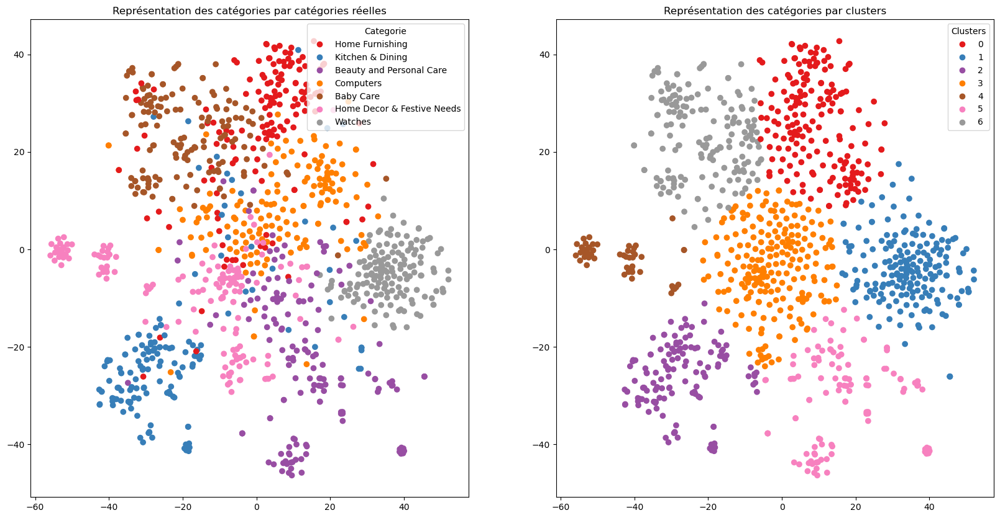

In [93]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [94]:
metrique_dense = calcul_metrics_clustering(labels_true, labels_pred, 'dense')
dataframe_metrique = dataframe_metrique.append(metrique_dense, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466


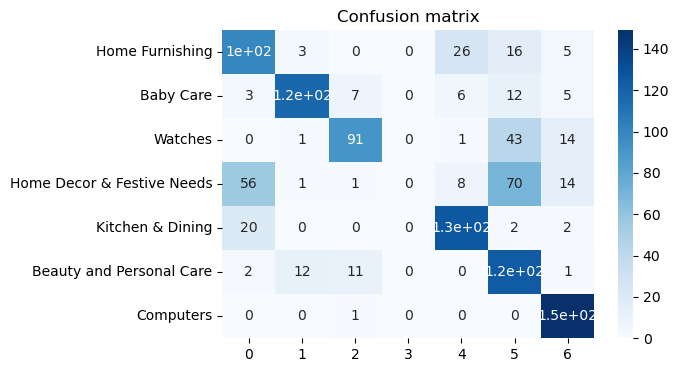

In [95]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

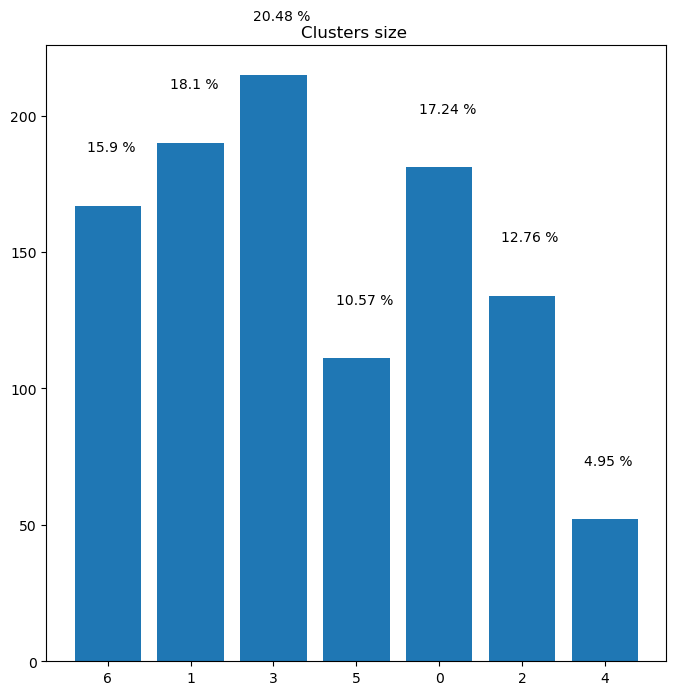

In [96]:
taille_cluster(df_tsne["cluster"])

In [97]:
# Les catégories par clusters
df_tsne.groupby('cluster')['class'].value_counts(). \
    to_frame()

class
cluster class                            
0       Baby Care                     100
        Home Decor & Festive Needs     56
        Home Furnishing                20
        Beauty and Personal Care        3
        Kitchen & Dining                2
1       Watches                       149
        Computers                      14
        Home Decor & Festive Needs     14
        Baby Care                       5
        Beauty and Personal Care        5
        Home Furnishing                 2
        Kitchen & Dining                1
2       Beauty and Personal Care      117
        Kitchen & Dining               12
        Baby Care                       3
        Computers                       1
        Home Decor & Festive Needs      1
3       Kitchen & Dining               75
        Home Decor & Festive Needs     68
        Computers                      43
        Baby Care                      15
        Beauty and Personal Care       12
        Home Furnishing                 2
4       Kitchen & Dining               49
        Home Decor & Festive Needs      2
        Baby Care                       1
5       Computers                      91
        Kitchen & Dining               11
        Beauty and Personal Care        7
        Home Decor & Festive Needs      1
        Watches                         1
6       Home Furnishing               126
        Baby Care                      26
        Home Decor & Festive Needs      8
        Beauty and Personal Care        6
        Computers                       1

### InceptionResNetV2

In [98]:
from tensorflow.keras.applications import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input

model = InceptionResNetV2(weights='imagenet', include_top=False)
incepres_all_features = transfer_learn(model)

Model: "inception_resnet_v2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, None, None,  0           []                               
                                 3)]                                                              
                                                                                                  
 conv2d_94 (Conv2D)             (None, None, None,   864         ['input_5[0][0]']                
                                32)                                                               
                                                                                                  
 batch_normalization_94 (BatchN  (None, None, None,   96         ['conv2d_94[0][0]']              
 ormalization)                  32)                                             

                                                                                                  
 average_pooling2d_9 (AveragePo  (None, None, None,   0          ['max_pooling2d_5[0][0]']        
 oling2D)                       192)                                                              
                                                                                                  
 conv2d_99 (Conv2D)             (None, None, None,   18432       ['max_pooling2d_5[0][0]']        
                                96)                                                               
                                                                                                  
 conv2d_101 (Conv2D)            (None, None, None,   76800       ['activation_100[0][0]']         
                                64)                                                               
                                                                                                  
 conv2d_10

                                                                                                  
 batch_normalization_108 (Batch  (None, None, None,   96         ['conv2d_108[0][0]']             
 Normalization)                 32)                                                               
                                                                                                  
 batch_normalization_111 (Batch  (None, None, None,   192        ['conv2d_111[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 activation_106 (Activation)    (None, None, None,   0           ['batch_normalization_106[0][0]']
                                32)                                                               
                                                                                                  
 activatio

 block35_2_mixed (Concatenate)  (None, None, None,   0           ['activation_112[0][0]',         
                                128)                              'activation_114[0][0]',         
                                                                  'activation_117[0][0]']         
                                                                                                  
 block35_2_conv (Conv2D)        (None, None, None,   41280       ['block35_2_mixed[0][0]']        
                                320)                                                              
                                                                                                  
 block35_2 (Lambda)             (None, None, None,   0           ['block35_1_ac[0][0]',           
                                320)                              'block35_2_conv[0][0]']         
                                                                                                  
 block35_2

 batch_normalization_127 (Batch  (None, None, None,   96         ['conv2d_127[0][0]']             
 Normalization)                 32)                                                               
                                                                                                  
 activation_127 (Activation)    (None, None, None,   0           ['batch_normalization_127[0][0]']
                                32)                                                               
                                                                                                  
 conv2d_125 (Conv2D)            (None, None, None,   10240       ['block35_3_ac[0][0]']           
                                32)                                                               
                                                                                                  
 conv2d_128 (Conv2D)            (None, None, None,   13824       ['activation_127[0][0]']         
          

 Normalization)                 48)                                                               
                                                                                                  
 activation_131 (Activation)    (None, None, None,   0           ['batch_normalization_131[0][0]']
                                32)                                                               
                                                                                                  
 activation_134 (Activation)    (None, None, None,   0           ['batch_normalization_134[0][0]']
                                48)                                                               
                                                                                                  
 conv2d_130 (Conv2D)            (None, None, None,   10240       ['block35_4_ac[0][0]']           
                                32)                                                               
          

                                                                                                  
 batch_normalization_136 (Batch  (None, None, None,   96         ['conv2d_136[0][0]']             
 Normalization)                 32)                                                               
                                                                                                  
 batch_normalization_138 (Batch  (None, None, None,   96         ['conv2d_138[0][0]']             
 Normalization)                 32)                                                               
                                                                                                  
 batch_normalization_141 (Batch  (None, None, None,   192        ['conv2d_141[0][0]']             
 Normalization)                 64)                                                               
                                                                                                  
 activatio

 activation_147 (Activation)    (None, None, None,   0           ['batch_normalization_147[0][0]']
                                64)                                                               
                                                                                                  
 block35_7_mixed (Concatenate)  (None, None, None,   0           ['activation_142[0][0]',         
                                128)                              'activation_144[0][0]',         
                                                                  'activation_147[0][0]']         
                                                                                                  
 block35_7_conv (Conv2D)        (None, None, None,   41280       ['block35_7_mixed[0][0]']        
                                320)                                                              
                                                                                                  
 block35_7

 conv2d_157 (Conv2D)            (None, None, None,   10240       ['block35_8_ac[0][0]']           
                                32)                                                               
                                                                                                  
 batch_normalization_157 (Batch  (None, None, None,   96         ['conv2d_157[0][0]']             
 Normalization)                 32)                                                               
                                                                                                  
 activation_157 (Activation)    (None, None, None,   0           ['batch_normalization_157[0][0]']
                                32)                                                               
                                                                                                  
 conv2d_155 (Conv2D)            (None, None, None,   10240       ['block35_8_ac[0][0]']           
          

 Normalization)                 32)                                                               
                                                                                                  
 batch_normalization_164 (Batch  (None, None, None,   144        ['conv2d_164[0][0]']             
 Normalization)                 48)                                                               
                                                                                                  
 activation_161 (Activation)    (None, None, None,   0           ['batch_normalization_161[0][0]']
                                32)                                                               
                                                                                                  
 activation_164 (Activation)    (None, None, None,   0           ['batch_normalization_164[0][0]']
                                48)                                                               
          

                                                                                                  
 activation_169 (Activation)    (None, None, None,   0           ['batch_normalization_169[0][0]']
                                384)                                                              
                                                                                                  
 max_pooling2d_6 (MaxPooling2D)  (None, None, None,   0          ['block35_10_ac[0][0]']          
                                320)                                                              
                                                                                                  
 mixed_6a (Concatenate)         (None, None, None,   0           ['activation_166[0][0]',         
                                1088)                             'activation_169[0][0]',         
                                                                  'max_pooling2d_6[0][0]']        
          

 batch_normalization_174 (Batch  (None, None, None,   576        ['conv2d_174[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_177 (Batch  (None, None, None,   576        ['conv2d_177[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activation_174 (Activation)    (None, None, None,   0           ['batch_normalization_174[0][0]']
                                192)                                                              
                                                                                                  
 activation_177 (Activation)    (None, None, None,   0           ['batch_normalization_177[0][0]']
          

                                                                                                  
 batch_normalization_184 (Batch  (None, None, None,   480        ['conv2d_184[0][0]']             
 Normalization)                 160)                                                              
                                                                                                  
 activation_184 (Activation)    (None, None, None,   0           ['batch_normalization_184[0][0]']
                                160)                                                              
                                                                                                  
 conv2d_182 (Conv2D)            (None, None, None,   208896      ['block17_3_ac[0][0]']           
                                192)                                                              
                                                                                                  
 conv2d_18

                                1088)                                                             
                                                                                                  
 conv2d_191 (Conv2D)            (None, None, None,   139264      ['block17_5_ac[0][0]']           
                                128)                                                              
                                                                                                  
 batch_normalization_191 (Batch  (None, None, None,   384        ['conv2d_191[0][0]']             
 Normalization)                 128)                                                              
                                                                                                  
 activation_191 (Activation)    (None, None, None,   0           ['batch_normalization_191[0][0]']
                                128)                                                              
          

 activation_197 (Activation)    (None, None, None,   0           ['batch_normalization_197[0][0]']
                                192)                                                              
                                                                                                  
 block17_7_mixed (Concatenate)  (None, None, None,   0           ['activation_194[0][0]',         
                                384)                              'activation_197[0][0]']         
                                                                                                  
 block17_7_conv (Conv2D)        (None, None, None,   418880      ['block17_7_mixed[0][0]']        
                                1088)                                                             
                                                                                                  
 block17_7 (Lambda)             (None, None, None,   0           ['block17_6_ac[0][0]',           
          

                                                                                                  
 conv2d_205 (Conv2D)            (None, None, None,   215040      ['activation_204[0][0]']         
                                192)                                                              
                                                                                                  
 batch_normalization_202 (Batch  (None, None, None,   576        ['conv2d_202[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_205 (Batch  (None, None, None,   576        ['conv2d_205[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activatio

                                128)                                                              
                                                                                                  
 conv2d_212 (Conv2D)            (None, None, None,   143360      ['activation_211[0][0]']         
                                160)                                                              
                                                                                                  
 batch_normalization_212 (Batch  (None, None, None,   480        ['conv2d_212[0][0]']             
 Normalization)                 160)                                                              
                                                                                                  
 activation_212 (Activation)    (None, None, None,   0           ['batch_normalization_212[0][0]']
                                160)                                                              
          

 block17_12 (Lambda)            (None, None, None,   0           ['block17_11_ac[0][0]',          
                                1088)                             'block17_12_conv[0][0]']        
                                                                                                  
 block17_12_ac (Activation)     (None, None, None,   0           ['block17_12[0][0]']             
                                1088)                                                             
                                                                                                  
 conv2d_219 (Conv2D)            (None, None, None,   139264      ['block17_12_ac[0][0]']          
                                128)                                                              
                                                                                                  
 batch_normalization_219 (Batch  (None, None, None,   384        ['conv2d_219[0][0]']             
 Normaliza

                                                                                                  
 activation_222 (Activation)    (None, None, None,   0           ['batch_normalization_222[0][0]']
                                192)                                                              
                                                                                                  
 activation_225 (Activation)    (None, None, None,   0           ['batch_normalization_225[0][0]']
                                192)                                                              
                                                                                                  
 block17_14_mixed (Concatenate)  (None, None, None,   0          ['activation_222[0][0]',         
                                384)                              'activation_225[0][0]']         
                                                                                                  
 block17_1

                                160)                                                              
                                                                                                  
 conv2d_230 (Conv2D)            (None, None, None,   208896      ['block17_15_ac[0][0]']          
                                192)                                                              
                                                                                                  
 conv2d_233 (Conv2D)            (None, None, None,   215040      ['activation_232[0][0]']         
                                192)                                                              
                                                                                                  
 batch_normalization_230 (Batch  (None, None, None,   576        ['conv2d_230[0][0]']             
 Normalization)                 192)                                                              
          

 batch_normalization_239 (Batch  (None, None, None,   384        ['conv2d_239[0][0]']             
 Normalization)                 128)                                                              
                                                                                                  
 activation_239 (Activation)    (None, None, None,   0           ['batch_normalization_239[0][0]']
                                128)                                                              
                                                                                                  
 conv2d_240 (Conv2D)            (None, None, None,   143360      ['activation_239[0][0]']         
                                160)                                                              
                                                                                                  
 batch_normalization_240 (Batch  (None, None, None,   480        ['conv2d_240[0][0]']             
 Normaliza

                                                                                                  
 block17_19_conv (Conv2D)       (None, None, None,   418880      ['block17_19_mixed[0][0]']       
                                1088)                                                             
                                                                                                  
 block17_19 (Lambda)            (None, None, None,   0           ['block17_18_ac[0][0]',          
                                1088)                             'block17_19_conv[0][0]']        
                                                                                                  
 block17_19_ac (Activation)     (None, None, None,   0           ['block17_19[0][0]']             
                                1088)                                                             
                                                                                                  
 conv2d_24

 Normalization)                 288)                                                              
                                                                                                  
 activation_250 (Activation)    (None, None, None,   0           ['batch_normalization_250[0][0]']
                                256)                                                              
                                                                                                  
 activation_252 (Activation)    (None, None, None,   0           ['batch_normalization_252[0][0]']
                                256)                                                              
                                                                                                  
 activation_255 (Activation)    (None, None, None,   0           ['batch_normalization_255[0][0]']
                                288)                                                              
          

                                448)                              'activation_260[0][0]']         
                                                                                                  
 block8_1_conv (Conv2D)         (None, None, None,   933920      ['block8_1_mixed[0][0]']         
                                2080)                                                             
                                                                                                  
 block8_1 (Lambda)              (None, None, None,   0           ['mixed_7a[0][0]',               
                                2080)                             'block8_1_conv[0][0]']          
                                                                                                  
 block8_1_ac (Activation)       (None, None, None,   0           ['block8_1[0][0]']               
                                2080)                                                             
          

 batch_normalization_265 (Batch  (None, None, None,   576        ['conv2d_265[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_268 (Batch  (None, None, None,   768        ['conv2d_268[0][0]']             
 Normalization)                 256)                                                              
                                                                                                  
 activation_265 (Activation)    (None, None, None,   0           ['batch_normalization_265[0][0]']
                                192)                                                              
                                                                                                  
 activation_268 (Activation)    (None, None, None,   0           ['batch_normalization_268[0][0]']
          

                                                                                                  
 batch_normalization_275 (Batch  (None, None, None,   672        ['conv2d_275[0][0]']             
 Normalization)                 224)                                                              
                                                                                                  
 activation_275 (Activation)    (None, None, None,   0           ['batch_normalization_275[0][0]']
                                224)                                                              
                                                                                                  
 conv2d_273 (Conv2D)            (None, None, None,   399360      ['block8_4_ac[0][0]']            
                                192)                                                              
                                                                                                  
 conv2d_27

                                2080)                                                             
                                                                                                  
 conv2d_282 (Conv2D)            (None, None, None,   399360      ['block8_6_ac[0][0]']            
                                192)                                                              
                                                                                                  
 batch_normalization_282 (Batch  (None, None, None,   576        ['conv2d_282[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 activation_282 (Activation)    (None, None, None,   0           ['batch_normalization_282[0][0]']
                                192)                                                              
          

 activation_288 (Activation)    (None, None, None,   0           ['batch_normalization_288[0][0]']
                                256)                                                              
                                                                                                  
 block8_8_mixed (Concatenate)   (None, None, None,   0           ['activation_285[0][0]',         
                                448)                              'activation_288[0][0]']         
                                                                                                  
 block8_8_conv (Conv2D)         (None, None, None,   933920      ['block8_8_mixed[0][0]']         
                                2080)                                                             
                                                                                                  
 block8_8 (Lambda)              (None, None, None,   0           ['block8_7_ac[0][0]',            
          

                                                                                                  
 conv2d_296 (Conv2D)            (None, None, None,   172032      ['activation_295[0][0]']         
                                256)                                                              
                                                                                                  
 batch_normalization_293 (Batch  (None, None, None,   576        ['conv2d_293[0][0]']             
 Normalization)                 192)                                                              
                                                                                                  
 batch_normalization_296 (Batch  (None, None, None,   768        ['conv2d_296[0][0]']             
 Normalization)                 256)                                                              
                                                                                                  
 activatio

1/1 [==============================] - 3s 3s/step


1/1 [==============================] - 4s 4s/step


1/1 [==============================] - 4s 4s/step


In [99]:
feat_pca = reduction_pca(incepres_all_features)

Dimensions dataset avant réduction PCA :  (1050, 38400)
Dimensions dataset après réduction PCA :  (1050, 897)


In [100]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.5032
perplexity :  20 ------- ARI :  0.5003
perplexity :  30 ------- ARI :  0.4582
perplexity :  40 ------- ARI :  0.4737
perplexity :  50 ------- ARI :  0.4241


In [101]:
df_tsne = reduction_tsne(feat_pca, 20)

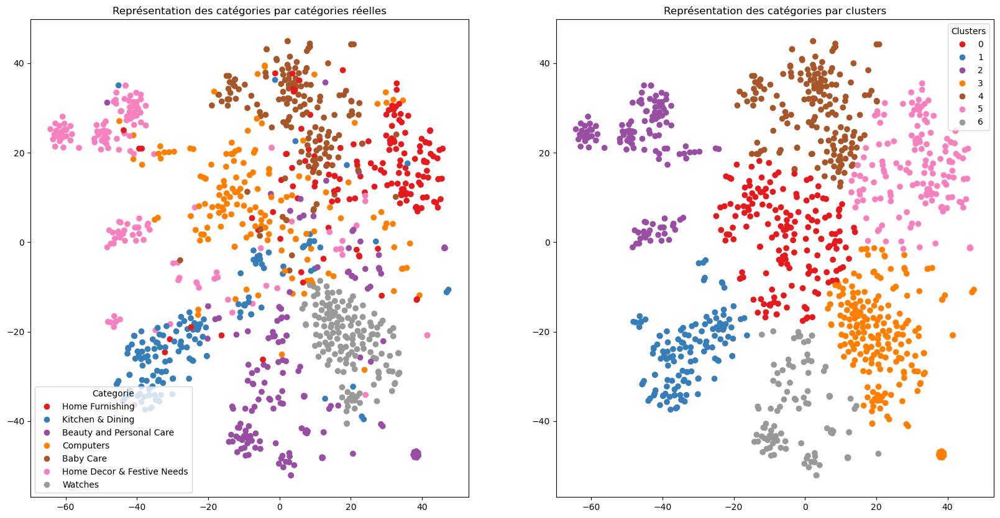

In [102]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [103]:
metrique_incepres= calcul_metrics_clustering(labels_true, labels_pred, 'incepresn')
dataframe_metrique = dataframe_metrique.append(metrique_incepres, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466
6,incepresn,0.5003,0.5475,0.5542,0.5508


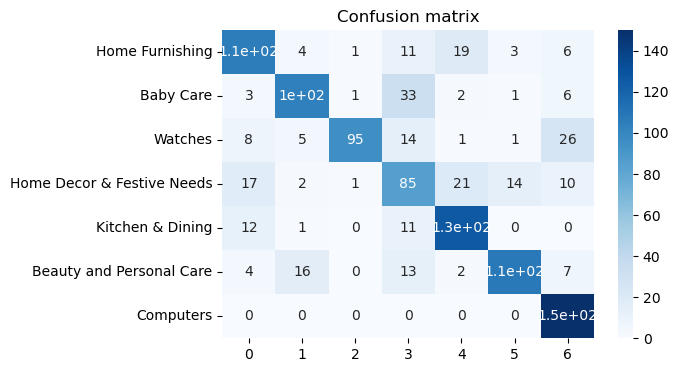

In [104]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

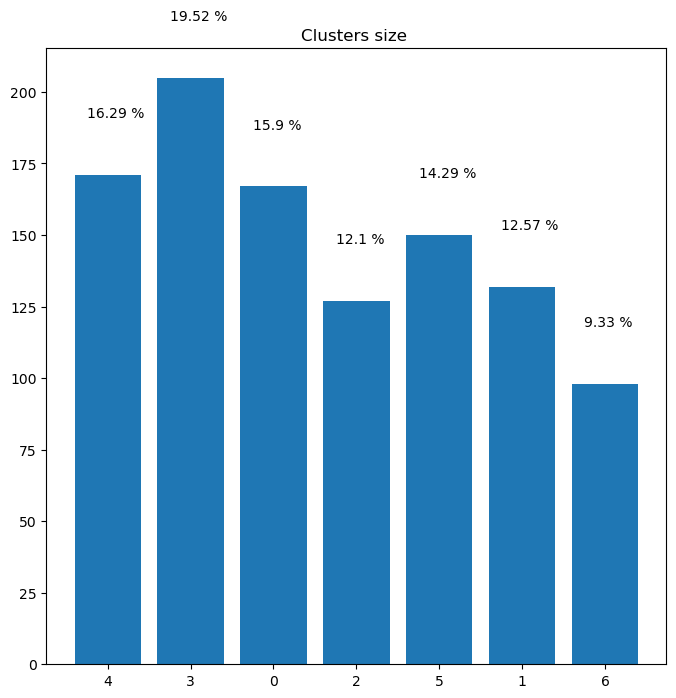

In [105]:
taille_cluster(df_tsne["cluster"])

In [106]:
# Les catégories par clusters
df_tsne.groupby('cluster')['class'].value_counts(). \
    to_frame()

class
cluster class                            
0       Home Decor & Festive Needs     85
        Beauty and Personal Care       33
        Computers                      14
        Kitchen & Dining               13
        Baby Care                      11
        Home Furnishing                11
1       Beauty and Personal Care      104
        Kitchen & Dining               16
        Computers                       5
        Baby Care                       4
        Home Decor & Festive Needs      2
        Home Furnishing                 1
2       Kitchen & Dining              108
        Home Decor & Festive Needs     14
        Baby Care                       3
        Beauty and Personal Care        1
        Computers                       1
3       Watches                       150
        Computers                      26
        Home Decor & Festive Needs     10
        Kitchen & Dining                7
        Baby Care                       6
        Beauty and Personal Care        6
4       Home Furnishing               126
        Home Decor & Festive Needs     21
        Baby Care                      19
        Beauty and Personal Care        2
        Kitchen & Dining                2
        Computers                       1
5       Baby Care                     106
        Home Decor & Festive Needs     17
        Home Furnishing                12
        Computers                       8
        Kitchen & Dining                4
        Beauty and Personal Care        3
6       Computers                      95
        Baby Care                       1
        Beauty and Personal Care        1
        Home Decor & Festive Needs      1

# Traitement de texte

In [107]:
# Tokenizer

def tokenizer_fct(sentence) :
    # print(sentence)
    sentence_clean = sentence.replace('-', ' ').replace('+', ' ').replace('/', ' ').replace('#', ' ')
    word_tokens = word_tokenize(sentence_clean)
    return word_tokens

# Stop words
from nltk.corpus import stopwords
stop_w = list(set(stopwords.words('english'))) + ['[', ']', ',', '.', ':', '?', '(', ')']

def stop_word_filter_fct(list_words) :
    filtered_w = [w for w in list_words if not w in stop_w]
    filtered_w2 = [w for w in filtered_w if len(w) > 2]
    return filtered_w2

# lower case et alpha
def lower_start_fct(list_words) :
    lw = [w.lower() for w in list_words if (not w.startswith("@")) 
    #                                   and (not w.startswith("#"))
                                       and (not w.startswith("http"))]
    return lw

# Lemmatizer (base d'un mot)
from nltk.stem import WordNetLemmatizer

def lemma_fct(list_words) :
    lemmatizer = WordNetLemmatizer()
    lem_w = [lemmatizer.lemmatize(w) for w in list_words]
    return lem_w

# Fonction de préparation du texte pour le bag of words (Countvectorizer et Tf_idf, Word2Vec)
def transform_bow_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

def transform_bow_lem_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    sw = stop_word_filter_fct(word_tokens)
    lw = lower_start_fct(sw)
    lem_w = lemma_fct(lw)    
    transf_desc_text = ' '.join(lem_w)
    return transf_desc_text

def transform_dl_fct(desc_text) :
    word_tokens = tokenizer_fct(desc_text)
    lw = lower_start_fct(word_tokens)
    transf_desc_text = ' '.join(lw)
    return transf_desc_text

In [108]:
data_nlp  = data_netoyee.copy()

In [109]:
data_nlp.head()

,image,description,categorie,label
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,4
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,0
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,0
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,4
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,4


## Exemple de pré-traitement 

In [110]:
text_test = data_nlp['description'].head(1)
print(data_nlp['description'][0])
print('\n')
print(len(data_nlp['description'][0]))

Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you 

In [111]:
import re
#Suppresion des chiffres
text_test = (re.sub(r'\d+', '', text_test.item()))
print(text_test)
print('\n')
print(len(text_test))

Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain ( cm in Height, Pack of ) Price: Rs.  This curtain enhances the look of the interiors.This curtain is made from % high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you get the ri

In [112]:
#suppresion des petits mots
shortword = re.compile(r'\W*\b\w{1,2}\b')
text_test=shortword.sub('', text_test)
print(text_test)
print('\n')
print(len(text_test))

Key Features Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain Height, Pack ) Price.  This curtain enhances the look the interiors.This curtain made from % high quality polyester fabric features eyelet style stitch with Metal Ring makes the room environment romantic and loving.This curtain ant- wrinkle and anti shrinkage and have elegant apparance.Give your home bright and modernistic appeal with these designs. The surreal attention sure steal hearts. These contemporary eyelet and valance curtains slide smoothly when you draw them apart first thing the morning welcome the bright sun rays you want wish good morning the whole world and when you draw them close the evening, you create the most special moments joyous beauty given the soothing prints. Bring home the elegant curtain that softly filters light your room that you get the right amount sunlight.,Specifications Elegance Polyester Multicolor Abstract

In [113]:
# Extraction des tokens
tokenizer = nltk.RegexpTokenizer(r'\w+')
text_test=tokenizer.tokenize(text_test)
print(text_test)
print('\n')
print(len(text_test))

['Key', 'Features', 'Elegance', 'Polyester', 'Multicolor', 'Abstract', 'Eyelet', 'Door', 'Curtain', 'Floral', 'Curtain', 'Elegance', 'Polyester', 'Multicolor', 'Abstract', 'Eyelet', 'Door', 'Curtain', 'Height', 'Pack', 'Price', 'This', 'curtain', 'enhances', 'the', 'look', 'the', 'interiors', 'This', 'curtain', 'made', 'from', 'high', 'quality', 'polyester', 'fabric', 'features', 'eyelet', 'style', 'stitch', 'with', 'Metal', 'Ring', 'makes', 'the', 'room', 'environment', 'romantic', 'and', 'loving', 'This', 'curtain', 'ant', 'wrinkle', 'and', 'anti', 'shrinkage', 'and', 'have', 'elegant', 'apparance', 'Give', 'your', 'home', 'bright', 'and', 'modernistic', 'appeal', 'with', 'these', 'designs', 'The', 'surreal', 'attention', 'sure', 'steal', 'hearts', 'These', 'contemporary', 'eyelet', 'and', 'valance', 'curtains', 'slide', 'smoothly', 'when', 'you', 'draw', 'them', 'apart', 'first', 'thing', 'the', 'morning', 'welcome', 'the', 'bright', 'sun', 'rays', 'you', 'want', 'wish', 'good', 'mo

In [114]:
#Normalisation
text_test_low = []
for i in text_test:
    text_test_low.append(i.lower())
print(text_test_low)
print('\n')
print(len(text_test_low))

['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'this', 'curtain', 'enhances', 'the', 'look', 'the', 'interiors', 'this', 'curtain', 'made', 'from', 'high', 'quality', 'polyester', 'fabric', 'features', 'eyelet', 'style', 'stitch', 'with', 'metal', 'ring', 'makes', 'the', 'room', 'environment', 'romantic', 'and', 'loving', 'this', 'curtain', 'ant', 'wrinkle', 'and', 'anti', 'shrinkage', 'and', 'have', 'elegant', 'apparance', 'give', 'your', 'home', 'bright', 'and', 'modernistic', 'appeal', 'with', 'these', 'designs', 'the', 'surreal', 'attention', 'sure', 'steal', 'hearts', 'these', 'contemporary', 'eyelet', 'and', 'valance', 'curtains', 'slide', 'smoothly', 'when', 'you', 'draw', 'them', 'apart', 'first', 'thing', 'the', 'morning', 'welcome', 'the', 'bright', 'sun', 'rays', 'you', 'want', 'wish', 'good', 'mo

In [115]:
#Stop word et adverbes/adjectifs

text_test_stword = stop_word_filter_fct(text_test_low)
print(text_test_stword)
print('\n')
print(len(text_test_stword))

['key', 'features', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'enhances', 'look', 'interiors', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric', 'features', 'eyelet', 'style', 'stitch', 'metal', 'ring', 'makes', 'room', 'environment', 'romantic', 'loving', 'curtain', 'ant', 'wrinkle', 'anti', 'shrinkage', 'elegant', 'apparance', 'give', 'home', 'bright', 'modernistic', 'appeal', 'designs', 'surreal', 'attention', 'sure', 'steal', 'hearts', 'contemporary', 'eyelet', 'valance', 'curtains', 'slide', 'smoothly', 'draw', 'apart', 'first', 'thing', 'morning', 'welcome', 'bright', 'sun', 'rays', 'want', 'wish', 'good', 'morning', 'whole', 'world', 'draw', 'close', 'evening', 'create', 'special', 'moments', 'joyous', 'beauty', 'given', 'soothing', 'prints', 'bring', 'home', 'elegant', 'curtain', 'softly', 'fi

In [116]:
#lemmantisation

text_test_lem = lemma_fct(text_test_stword)    
print(text_test_lem)
print('\n')
print(len(text_test_lem))

['key', 'feature', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'floral', 'curtain', 'elegance', 'polyester', 'multicolor', 'abstract', 'eyelet', 'door', 'curtain', 'height', 'pack', 'price', 'curtain', 'enhances', 'look', 'interior', 'curtain', 'made', 'high', 'quality', 'polyester', 'fabric', 'feature', 'eyelet', 'style', 'stitch', 'metal', 'ring', 'make', 'room', 'environment', 'romantic', 'loving', 'curtain', 'ant', 'wrinkle', 'anti', 'shrinkage', 'elegant', 'apparance', 'give', 'home', 'bright', 'modernistic', 'appeal', 'design', 'surreal', 'attention', 'sure', 'steal', 'heart', 'contemporary', 'eyelet', 'valance', 'curtain', 'slide', 'smoothly', 'draw', 'apart', 'first', 'thing', 'morning', 'welcome', 'bright', 'sun', 'ray', 'want', 'wish', 'good', 'morning', 'whole', 'world', 'draw', 'close', 'evening', 'create', 'special', 'moment', 'joyous', 'beauty', 'given', 'soothing', 'print', 'bring', 'home', 'elegant', 'curtain', 'softly', 'filter', 'li

## Pré-traitement de tout le vocabulaire

In [117]:
data_nlp['sentence_bow'] = data_nlp['description'].apply(lambda x : transform_bow_fct(x))
data_nlp['sentence_bow_lem'] = data_nlp['description'].apply(lambda x : transform_bow_lem_fct(x))
data_nlp['sentence_dl'] = data_nlp['description'].apply(lambda x : transform_dl_fct(x))
data_nlp.shape

(1050, 7)

In [118]:
data_nlp.head()

,image,description,categorie,label,sentence_bow,sentence_bow_lem,sentence_dl
0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,Key Features of Elegance Polyester Multicolor ...,Home Furnishing,4,key features elegance polyester multicolor abs...,key feature elegance polyester multicolor abst...,key features of elegance polyester multicolor ...
1,7b72c92c2f6c40268628ec5f14c6d590.jpg,Specifications of Sathiyas Cotton Bath Towel (...,Baby Care,0,specifications sathiyas cotton bath towel bath...,specification sathiyas cotton bath towel bath ...,specifications of sathiyas cotton bath towel (...
2,64d5d4a258243731dc7bbb1eef49ad74.jpg,Key Features of Eurospa Cotton Terry Face Towe...,Baby Care,0,key features eurospa cotton terry face towel s...,key feature eurospa cotton terry face towel se...,key features of eurospa cotton terry face towe...
3,d4684dcdc759dd9cdf41504698d737d8.jpg,Key Features of SANTOSH ROYAL FASHION Cotton P...,Home Furnishing,4,key features santosh royal fashion cotton prin...,key feature santosh royal fashion cotton print...,key features of santosh royal fashion cotton p...
4,6325b6870c54cd47be6ebfbffa620ec7.jpg,Key Features of Jaipur Print Cotton Floral Kin...,Home Furnishing,4,key features jaipur print cotton floral king s...,key feature jaipur print cotton floral king si...,key features of jaipur print cotton floral kin...


In [119]:
data_nlp['length_bow'] = data_nlp['sentence_bow'].apply(lambda x : len(word_tokenize(x)))
print("max length bow : ", data_nlp['length_bow'].max())
data_nlp['length_dl'] = data_nlp['sentence_dl'].apply(lambda x : len(word_tokenize(x)))
print("max length dl : ", data_nlp['length_dl'].max())


max length bow :  379
max length dl :  632


## Bags of words - CountVectorizer


In [120]:
# création du bag of words (CountVectorizer)

cvect = CountVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'sentence_bow_lem'
cv_fit = cvect.fit(data_nlp[feat])

cv_transform = cvect.transform(data_nlp[feat])  


In [121]:
optimisation_perplexity(cv_transform, liste_perp)

perplexity :  10 ------- ARI :  0.4191
perplexity :  20 ------- ARI :  0.4214
perplexity :  30 ------- ARI :  0.3842
perplexity :  40 ------- ARI :  0.3524
perplexity :  50 ------- ARI :  0.3658


In [122]:
df_tsne = reduction_tsne(cv_transform, 20)

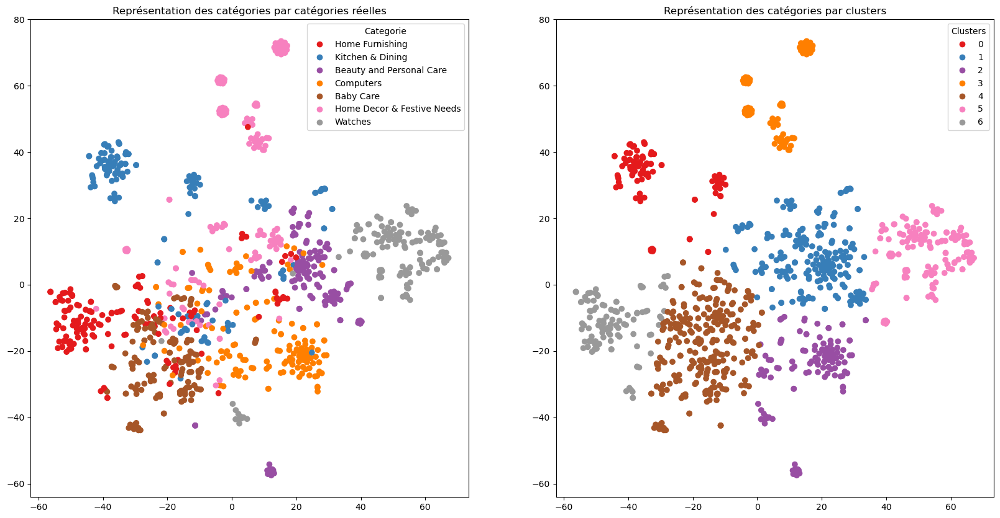

In [123]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [124]:
metrique_countvect = calcul_metrics_clustering(labels_true, labels_pred, 'countvect')
dataframe_metrique = dataframe_metrique.append(metrique_countvect, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466
6,incepresn,0.5003,0.5475,0.5542,0.5508
7,countvect,0.4214,0.5347,0.5609,0.5475


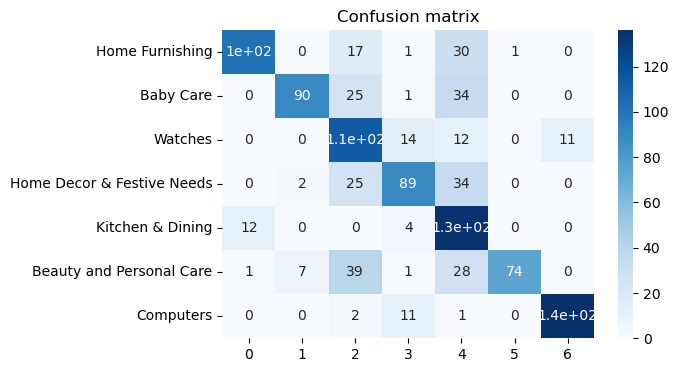

In [125]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

##  Bags of words - Tf-idf


In [126]:
# création du bag of words (Tf-idf)

ctf = TfidfVectorizer(stop_words='english', max_df=0.95, min_df=1)

feat = 'sentence_bow_lem'
ctf_fit = ctf.fit(data_nlp[feat])

ctf_transform = ctf.transform(data_nlp[feat]) 

In [127]:
optimisation_perplexity(ctf_transform, liste_perp)

perplexity :  10 ------- ARI :  0.5766
perplexity :  20 ------- ARI :  0.559
perplexity :  30 ------- ARI :  0.4282
perplexity :  40 ------- ARI :  0.3976
perplexity :  50 ------- ARI :  0.4134


In [128]:
df_tsne = reduction_tsne(ctf_transform, 10)


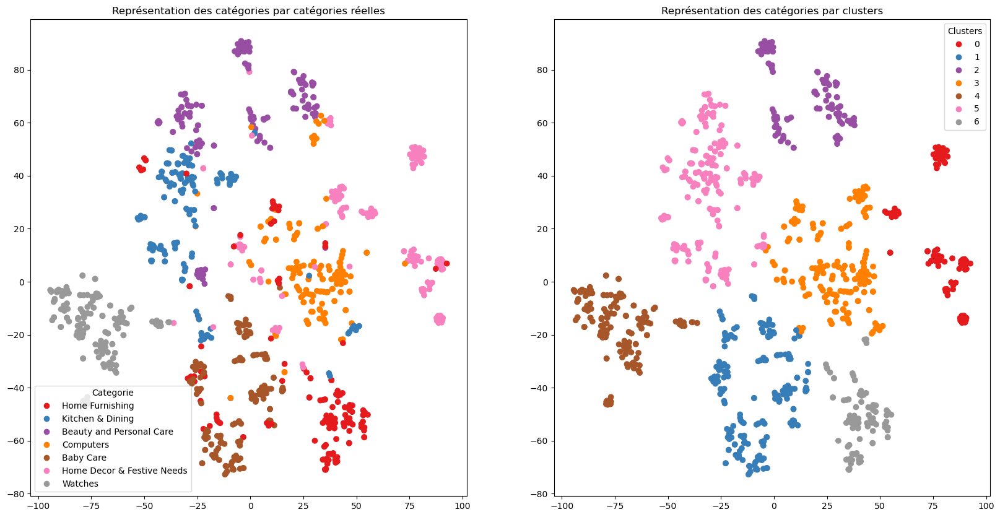

In [129]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [130]:
metrique_tfidf = calcul_metrics_clustering(labels_true, labels_pred, 'tfidf')
dataframe_metrique = dataframe_metrique.append(metrique_tfidf, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466
6,incepresn,0.5003,0.5475,0.5542,0.5508
7,countvect,0.4214,0.5347,0.5609,0.5475
8,tfidf,0.5766,0.6517,0.6693,0.6604


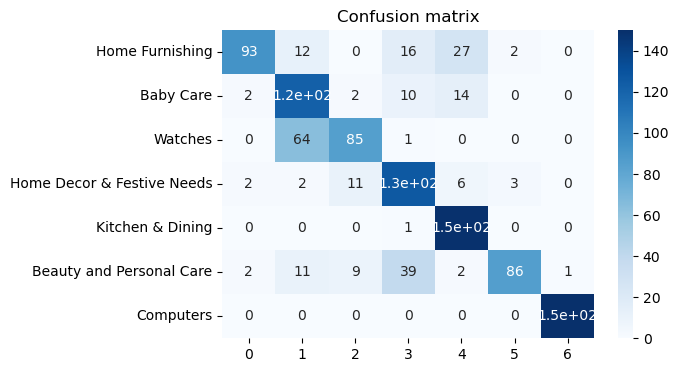

In [131]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

## Word2vec

### Entrainement d'un nouveau modèle

In [132]:
w2v_size=512
w2v_window=5
w2v_min_count=1
w2v_epochs=100
maxlen = 24 # adapt to length of sentences
sentences = data_nlp['sentence_bow_lem'].to_list()
sentences = [gensim.utils.simple_preprocess(text) for text in sentences]

In [133]:
# Création et entraînement du modèle Word2Vec

print("Build & train Word2Vec model ...")
w2v_model = gensim.models.Word2Vec(min_count=w2v_min_count, window=w2v_window,
                                                vector_size=w2v_size,
                                                seed=42,
                                                workers=1)
#                                                workers=multiprocessing.cpu_count())
w2v_model.build_vocab(sentences)
w2v_model.train(sentences, total_examples=w2v_model.corpus_count, epochs=w2v_epochs)
model_vectors = w2v_model.wv
w2v_words = model_vectors.index_to_key
print("Vocabulary size: %i" % len(w2v_words))
print("Word2Vec trained")

Build & train Word2Vec model ...
Vocabulary size: 4712
Word2Vec trained


In [134]:
# Préparation des sentences (tokenization)

print("Fit Tokenizer ...")
tokenizer = Tokenizer()
tokenizer.fit_on_texts(sentences)
x_sentences = pad_sequences(tokenizer.texts_to_sequences(sentences),
                                                     maxlen=maxlen,
                                                     padding='post') 
                                                   
num_words = len(tokenizer.word_index) + 1
print("Number of unique words: %i" % num_words)

Fit Tokenizer ...
Number of unique words: 4713


In [135]:
# Création de la matrice d'embedding

print("Create Embedding matrix ...")
w2v_size = 512
word_index = tokenizer.word_index
vocab_size = len(word_index) + 1
embedding_matrix = np.zeros((vocab_size, w2v_size))
i=0
j=0
    
for word, idx in word_index.items():
    i +=1
    if word in w2v_words:
        j +=1
        embedding_vector = model_vectors[word]
        if embedding_vector is not None:
            embedding_matrix[idx] = model_vectors[word]
            
word_rate = np.round(j/i,4)
print("Word embedding rate : ", word_rate)
print("Embedding matrix: %s" % str(embedding_matrix.shape))

Create Embedding matrix ...
Word embedding rate :  1.0
Embedding matrix: (4713, 512)


In [136]:
# Création du modèle

input=Input(shape=(len(x_sentences),maxlen),dtype='float64')
word_input=Input(shape=(maxlen,),dtype='float64')  
word_embedding=Embedding(input_dim=vocab_size,
                         output_dim=w2v_size,
                         weights = [embedding_matrix],
                         input_length=maxlen)(word_input)
word_vec=GlobalAveragePooling1D()(word_embedding)  
embed_model = Model([word_input],word_vec)

embed_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 24)]              0         
                                                                 
 embedding (Embedding)       (None, 24, 512)           2413056   
                                                                 
 global_average_pooling1d (G  (None, 512)              0         
 lobalAveragePooling1D)                                          
                                                                 
Total params: 2,413,056
Trainable params: 2,413,056
Non-trainable params: 0
_________________________________________________________________


In [137]:
embeddings = embed_model.predict(x_sentences)
embeddings.shape

33/33 [==============================] - 0s 4ms/step


(1050, 512)

In [138]:
optimisation_perplexity(embeddings, liste_perp)

perplexity :  10 ------- ARI :  0.1995
perplexity :  20 ------- ARI :  0.2768
perplexity :  30 ------- ARI :  0.2809
perplexity :  40 ------- ARI :  0.2884
perplexity :  50 ------- ARI :  0.2814


In [139]:
df_tsne = reduction_tsne(embeddings, 40)

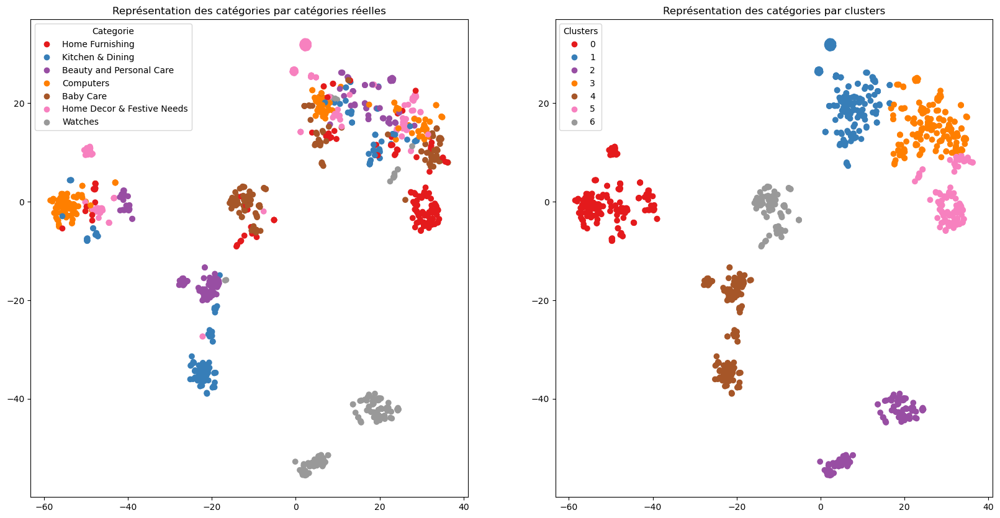

In [140]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

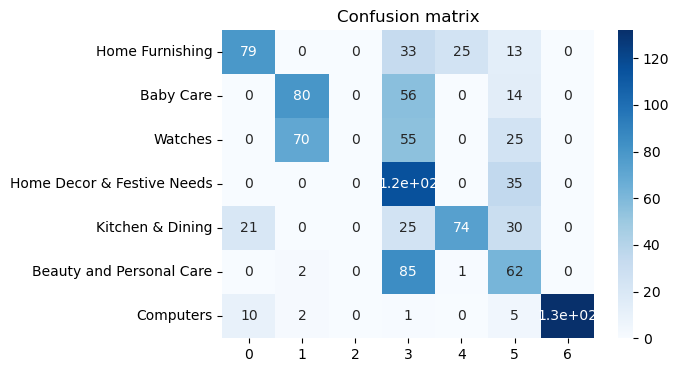

In [141]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

### Utilisation d'un modèle pré-entrainé

In [142]:
import gensim.downloader as gen_dow
word_2_vec = gen_dow.load("word2vec-google-news-300")  

In [143]:
word_2_vec.vectors.shape

(3000000, 300)

In [144]:
def doc_to_vec(document,model):
    size = model.vectors.shape[1]
    vecteur = np.zeros(size)
    nbre_token = 0
  
    for token in document:
        
        try:
            values = model[token]
            vecteur = vecteur + values
            nbre_token = nbre_token + 1.0
        except:
            pass
    
    if (nbre_token > 0.0):
        vecteur = vecteur/nbre_token
    return vecteur

In [145]:
sentences = [sent.split() for sent in data_nlp['sentence_dl'].to_list()]

In [146]:
docsVec = list()
for document in sentences:
    #calcul du vecteur
    vec = doc_to_vec(document, word_2_vec)
    docsVec.append(vec)
embeddings = np.array(docsVec)
print(embeddings.shape)

(1050, 300)


In [147]:
feat_pca = reduction_pca(embeddings)

Dimensions dataset avant réduction PCA :  (1050, 300)
Dimensions dataset après réduction PCA :  (1050, 224)


In [148]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.3841
perplexity :  20 ------- ARI :  0.4165
perplexity :  30 ------- ARI :  0.3885
perplexity :  40 ------- ARI :  0.3857
perplexity :  50 ------- ARI :  0.3884


In [149]:
df_tsne = reduction_tsne(feat_pca, 20)

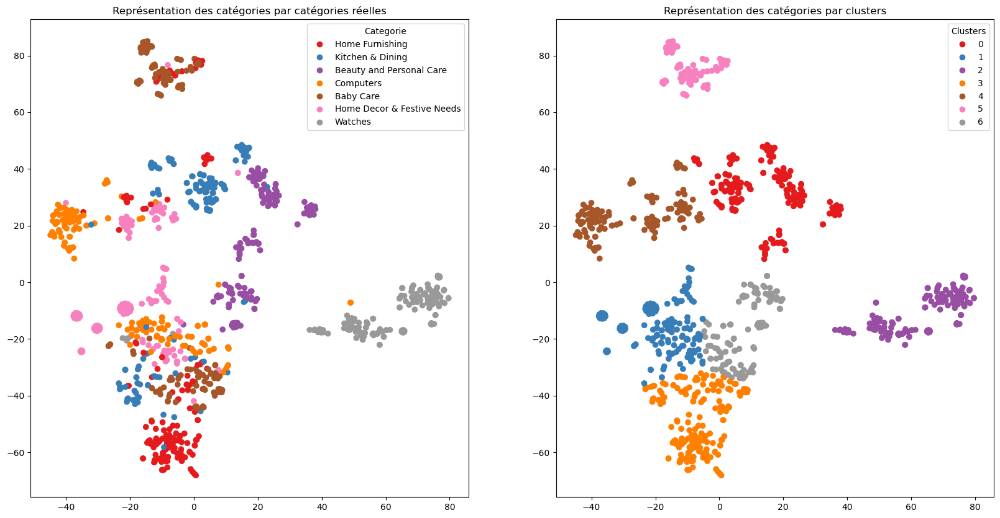

In [150]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [151]:
metrique_word2vec = calcul_metrics_clustering(labels_true, labels_pred, 'word2vec')
dataframe_metrique = dataframe_metrique.append(metrique_word2vec, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466
6,incepresn,0.5003,0.5475,0.5542,0.5508
7,countvect,0.4214,0.5347,0.5609,0.5475
8,tfidf,0.5766,0.6517,0.6693,0.6604
9,word2vec,0.4165,0.5333,0.5409,0.5371


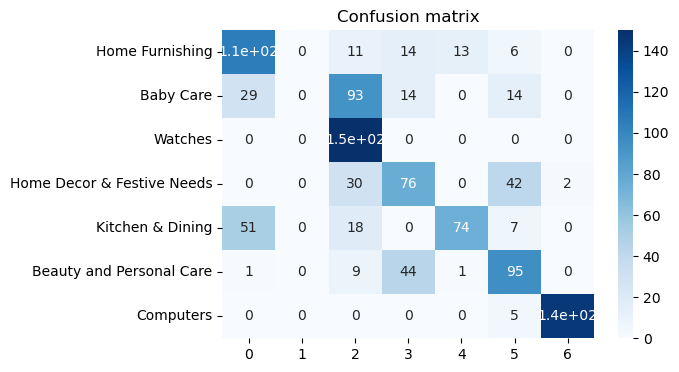

In [152]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

## BERT

In [153]:
# Fonction de préparation des sentences
def bert_inp_fct(sentences, bert_tokenizer, max_length) :
    input_ids=[]
    token_type_ids = []
    attention_mask=[]
    bert_inp_tot = []

    for sent in sentences:
        bert_inp = bert_tokenizer.encode_plus(sent,
                                              add_special_tokens = True,
                                              max_length = max_length,
                                              padding='max_length',
                                              return_attention_mask = True, 
                                              return_token_type_ids=True,
                                              truncation=True,
                                              return_tensors="tf")
    
        input_ids.append(bert_inp['input_ids'][0])
        token_type_ids.append(bert_inp['token_type_ids'][0])
        attention_mask.append(bert_inp['attention_mask'][0])
        bert_inp_tot.append((bert_inp['input_ids'][0], 
                             bert_inp['token_type_ids'][0], 
                             bert_inp['attention_mask'][0]))

    input_ids = np.asarray(input_ids)
    token_type_ids = np.asarray(token_type_ids)
    attention_mask = np.array(attention_mask)
    
    return input_ids, token_type_ids, attention_mask, bert_inp_tot
    

# Fonction de création des features
def feature_BERT_fct(model, model_type, sentences, max_length, b_size, mode='HF') :
    batch_size = b_size
    batch_size_pred = b_size
    bert_tokenizer = AutoTokenizer.from_pretrained(model_type)
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        input_ids, token_type_ids, attention_mask, bert_inp_tot = bert_inp_fct(sentences[idx:idx+batch_size], 
                                                                      bert_tokenizer, max_length)
        
        if mode=='HF' :    # Bert HuggingFace
            outputs = model.predict([input_ids, attention_mask, token_type_ids], batch_size=batch_size_pred)
            last_hidden_states = outputs.last_hidden_state

        if mode=='TFhub' : # Bert Tensorflow Hub
            text_preprocessed = {"input_word_ids" : input_ids, 
                                 "input_mask" : attention_mask, 
                                 "input_type_ids" : token_type_ids}
            outputs = model(text_preprocessed)
            last_hidden_states = outputs['sequence_output']
             
        if step ==0 :
            last_hidden_states_tot = last_hidden_states
            last_hidden_states_tot_0 = last_hidden_states
        else :
            last_hidden_states_tot = np.concatenate((last_hidden_states_tot,last_hidden_states))
    
    features_bert = np.array(last_hidden_states_tot).mean(axis=1)
    
    time2 = np.round(time.time() - time1,0)
    print("temps traitement : ", time2)
     
    return features_bert, last_hidden_states_tot

 BERT HuggingFace

In [154]:
max_length = 150
batch_size = 20
model_type = 'bert-base-uncased'
model = TFAutoModel.from_pretrained(model_type)
sentences = data_nlp['sentence_dl'].to_list()

loading configuration file config.json from cache at C:\Users\bouza/.cache\huggingface\hub\models--bert-base-uncased\snapshots\0a6aa9128b6194f4f3c4db429b6cb4891cdb421b\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.26.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading weights file tf_model.h5 from cache at C:\Users\bouza/.cache\huggingface\hub\models--bert-base-uncased\snapshots\0a6aa9128b6194f4f3c4db429b6cb4891cdb42

In [155]:
# Création des features

features_bert, last_hidden_states_tot = feature_BERT_fct(model, model_type, sentences, 
                                                         batch_size, max_length, mode='HF')

loading configuration file config.json from cache at C:\Users\bouza/.cache\huggingface\hub\models--bert-base-uncased\snapshots\0a6aa9128b6194f4f3c4db429b6cb4891cdb421b\config.json
Model config BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.26.0",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

loading file vocab.txt from cache at C:\Users\bouza/.cache\huggingface\hub\models--bert-base-uncased\snapshots\0a6aa9128b6194f4f3c4db429b6cb4891cdb421b\vocab.t

1/1 [==============================] - 21s 21s/step
temps traitement :  156.0


In [156]:
feat_pca = reduction_pca(features_bert)

Dimensions dataset avant réduction PCA :  (1050, 768)
Dimensions dataset après réduction PCA :  (1050, 401)


In [157]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.3924
perplexity :  20 ------- ARI :  0.3947
perplexity :  30 ------- ARI :  0.3891
perplexity :  40 ------- ARI :  0.3988
perplexity :  50 ------- ARI :  0.3828


In [158]:
df_tsne = reduction_tsne(feat_pca, 40)

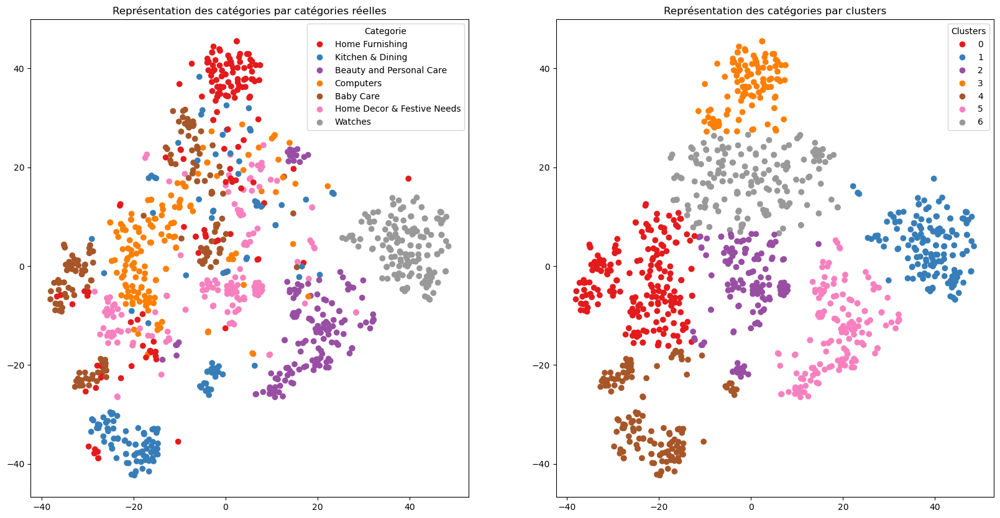

In [159]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [160]:
metrique_bert = calcul_metrics_clustering(labels_true, labels_pred, 'bert')
dataframe_metrique = dataframe_metrique.append(metrique_bert, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466
6,incepresn,0.5003,0.5475,0.5542,0.5508
7,countvect,0.4214,0.5347,0.5609,0.5475
8,tfidf,0.5766,0.6517,0.6693,0.6604
9,word2vec,0.4165,0.5333,0.5409,0.5371


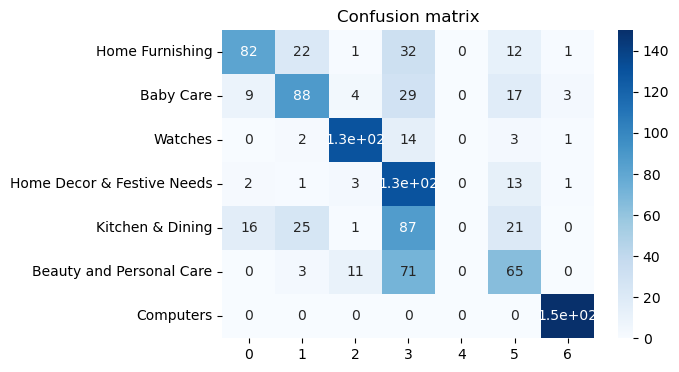

In [161]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

## USE - Universal Sentence Encoder

In [162]:
embed = hub.load('https://tfhub.dev/google/universal-sentence-encoder-large/5')

In [163]:
def feature_USE_fct(sentences, b_size) :
    batch_size = b_size
    time1 = time.time()

    for step in range(len(sentences)//batch_size) :
        idx = step*batch_size
        feat = embed(sentences[idx:idx+batch_size])

        if step ==0 :
            features = feat
        else :
            features = np.concatenate((features,feat))

    time2 = np.round(time.time() - time1,0)
    return features

In [164]:
batch_size = 10
sentences = data_nlp['sentence_dl'].to_list()

In [165]:
features_USE = feature_USE_fct(sentences, batch_size)

In [166]:
feat_pca = reduction_pca(features_USE)

Dimensions dataset avant réduction PCA :  (1050, 512)
Dimensions dataset après réduction PCA :  (1050, 280)


In [167]:
optimisation_perplexity(feat_pca, liste_perp)

perplexity :  10 ------- ARI :  0.5802
perplexity :  20 ------- ARI :  0.4817
perplexity :  30 ------- ARI :  0.4612
perplexity :  40 ------- ARI :  0.4672
perplexity :  50 ------- ARI :  0.464


In [168]:
df_tsne = reduction_tsne(feat_pca, 10)

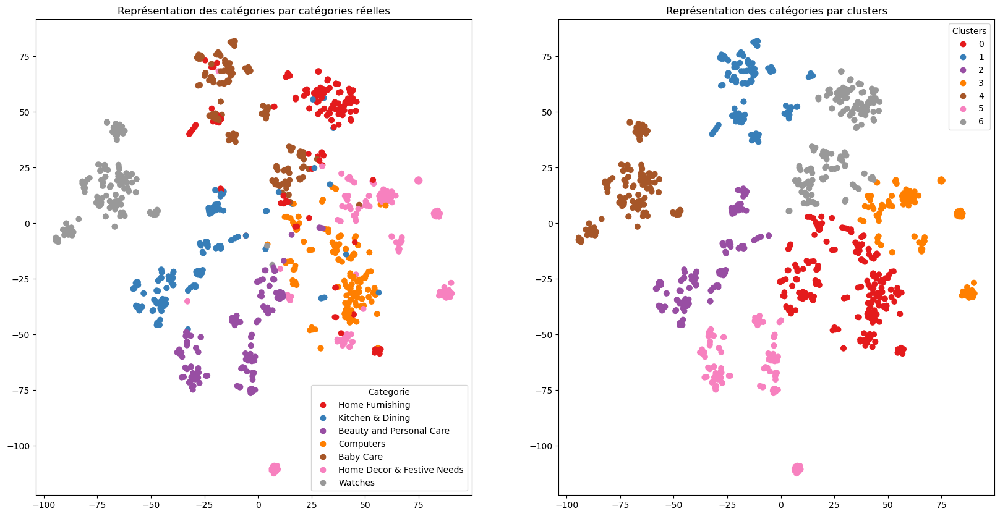

In [169]:
labels_pred = clustering_tsne(df_tsne)
TSNE_visu(df_tsne, labels_true, labels_pred)

In [170]:
metrique_use = calcul_metrics_clustering(labels_true, labels_pred, 'use')
dataframe_metrique = dataframe_metrique.append(metrique_use, ignore_index=True)
dataframe_metrique

,Methode,ARI,homogeneity,completeness,v_measure
0,sift,0.0427,0.0714,0.0718,0.0716
1,orb,0.0339,0.0580,0.0585,0.0582
2,vgg16,0.3521,0.4601,0.4722,0.4661
3,mobnet,0.3176,0.4069,0.4206,0.4136
4,inception,0.2562,0.3675,0.3847,0.3759
5,dense,0.4554,0.5372,0.5564,0.5466
6,incepresn,0.5003,0.5475,0.5542,0.5508
7,countvect,0.4214,0.5347,0.5609,0.5475
8,tfidf,0.5766,0.6517,0.6693,0.6604
9,word2vec,0.4165,0.5333,0.5409,0.5371


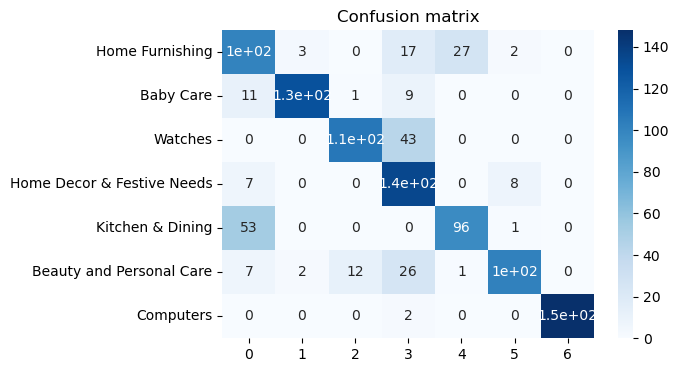

In [171]:
cls_labels_transform = conf_mat_transform(labels_true, labels_pred)
conf_mat = metrics.confusion_matrix(labels_true, cls_labels_transform)
showconfusionmatrix(conf_mat)

# Dataframe récapitulatif

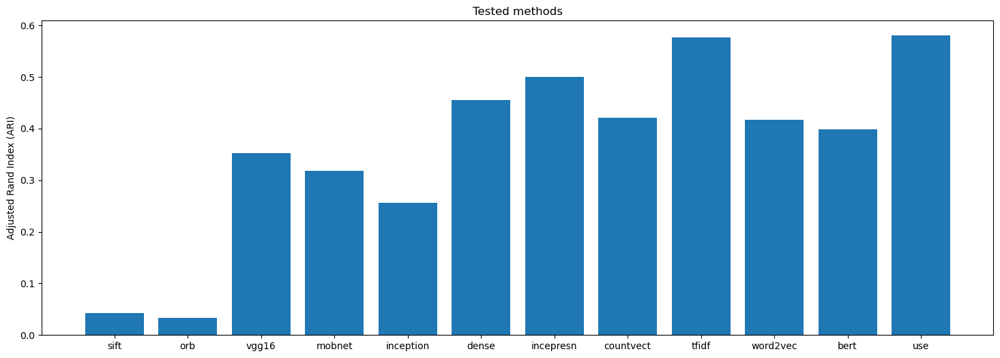

In [172]:
plt.figure(figsize = (18, 6))

plt.bar(range(len(dataframe_metrique)), list(dataframe_metrique['ARI'].values))
plt.xticks(range(len(dataframe_metrique)), list(dataframe_metrique['Methode'].values))
plt.ylabel('Adjusted Rand Index (ARI)')
plt.title('Tested methods')
plt.show()

In [173]:
fin_notebook = time.time()
print((fin_notebook - debut_notebook)/60)

174.11674769719443
